 <center> <h1> <b> Pattern Recognition and Machine Learning (EE2802 - AI2000) </b> </h1> </center>

<b> Programming Assignment 02 - Regression : </b> Welcome to the programming assignment (PA) on regression. This programing assignment focuses on understanding the basic concepts of linear regression.

<b> Instructions </b>

1. Plagiarism is strictly prohibited.
2. Delayed submissions are not accepted
3. Please DO NOT use any machine learning libraries unless and otherwise specified.


<center> <h2> <b> Understanding Basic Concepts </b> </h2> </center>

<b> Part - (1) : Understanding Error Surfaces </b>

According to www.geogebra.org, the relationship between human height (in
inches) and weight (in pounds) is given by <br>

<center> $t = 3.86x - 110.42$ </center>

(a) Generate 25 meaningful data points from this relationship, mimicking a
noisy sensor, where the noise follows a zero mean Gaussian with a variance
of 20. Plot the scatter plot of the data. <br>
(b) Now, we need to estimate the above relationship from the noisy data
generated in (a) by fitting a line, i.e $\hat{t} = y(x,w) = w_{0} + w_{1}x$. Let us use least squares criterion discussed in the class to estimate the parameters $w_{0}$ and $w_{1}$. Generate and plot the error surface $J(w_{0},w_{1})$ associated with this approach. Locate the minimum on this error surface.<br>

(c) Estimate the parameters using least squares approach, and compare them
with the desired values.

<center> $\textbf{w}_{opt} = (\textbf{X}^{T}\textbf{X})^{-1}\textbf{X}^{T}\textbf{t}$</center>

(d) Report all your observations


<b> Part - (2) : Understanding model order and overfitting </b>

(a). Generate 20 data points from $y_{n} = sin(2πx_{n}) + e_{n}$, where $x_{n} \in [0,1] $ and $e_{n} \thicksim \mathcal{N} (0,0.1)$ , and divide them into two sets, a training set and a testing set, with each set containing 10 points <br>

(b). Fit an $M^{th}$ degree polynomial to the training data using least squares approach, i.e.,

<center> $\hat{y_{n}} = w_{0} + w_{1}x + .... +  w_{m}x^{m} + ... + w_{M}x^{M} $ </center>

Use the estimated parameter vector $\textbf{w}$, to predict the target values in training and testing datasets. Plot the root mean squared error associated with each dataset, for M=0,1,...,9. Explain your results. <br>

(c) Increase the size of the training dataset to 100 points, and repeat (b). <br>

(d) Add a $l_{2}$ regularization term to the objective function in (b) and repeat (b) and (c). Study the affect of Lagrange multiplier λ on the root mean squared error of the training and testing datasets <br>

(e) Modify the function in (a) to $y_{n}=5+sin(2πx_{n})+e_{n}$ to study the effect of regularizing the bias coefficient $w_{0}$.


<b> Part - (3) : Understanding the choice of kernel </b>

(a). Generate 100 data points from $$y_{n}=sin(2πx_{n})+e_{n}$$, where $x_{n} \in [0 1]$ and $e_{n} \thicksim \mathcal{N}(0,0.1)$, and divide them into two sets, a training set and a testing test each containing 50 points. Fit an $M^{th}$ degree polynomial using polynomial,Gaussian and sigmoidal kernels, and study the goodness of fit in each case, for different model orders M

(b). Repeat (a) by modifying the target function to <br>

<center> 
$$
y_{n} = 
\begin{cases}
 \text{sinusoid} + e_{n} , & \text{where } x  \in [0,1) \\
 \text{triangle} + e_{n} , & \text{where } x  \in [1,2) \\
 \text{Gaussian} + e_{n} , & \text{where } x  \in [2,3) \\
\end{cases}
$$ 
</center>


<b> Part - (4) : Understanding online training </b>

(a). Repeat 3(a) and 3(b) using stochastic gradient descent for weight update.Study the effect of step size η on convergence of the weights, and compare them to those obtained using closed form expressions in 3. Plot the mse as a function of iterations.

(b). Study the effect of batch size on the speed of convergence

(c). Report all your observations


<b> Part - (5) : Understanding bias-variance trade-off </b>

(a). Generate L=100 datasets of noisy sinusoidal data, each having N=25 datapoints. For each dataset, fit a $M=25^{th}$ order linear regression model consisting of 24 Gaussian basis functions and one bias parameter. Use regularized least squares, governed by the parameter λ, to estimate the parameters $\textbf{w}$. Illustrate the concept of bias and variance using these 100 different parameter fits.

1.  Chose three different regularization coefficeints (low,middle and high)
2.  For every regularization coefficient, produce two plots: one displaying 100 estimated curves, and the other showing the mean of the estimated curves alongside the original function.
3.  For three regularization coefficients, you should have a total of six plots, meaning two plots for each regularization.
4.  Using the six plots above, describe the bias-variance trade-off.

(b). Report all your observations


<b> Part - (6) : Understanding
Maximum a Posteriori (MAP) estimate </b>

(a). Generate 100 noisy data points of a sinusoid. Fit a $20^{th}$ order linear regression model with Gaussian basis functions. Starting from a standard normal prior, update the statistics of the posterior density of the parameters using Bayesian sequential updates.

(b). Sample a parameter vector from the posterior distribution, and obtain the curve fit for this realization. Repeat this for several times, and estimate the average of these curve fits, and compare it with the original sinusoid

(c). Use the posterior distribution of the parameters to evaluate the predictive distribution of target $p(y_{0}/x_{0},X,y)$, and plot it for different number of training data points, as discussed in the class.

(d). Report all your observations


In [1]:
#Understanding Error Surface
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

<h1><b>Part 1 :Understanding Error Surfaces</b></h1>


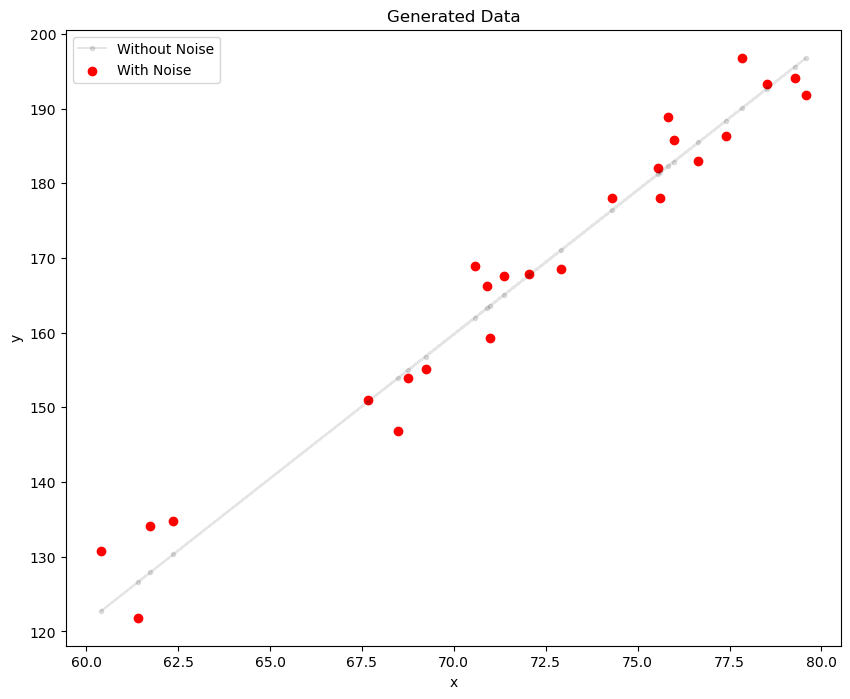

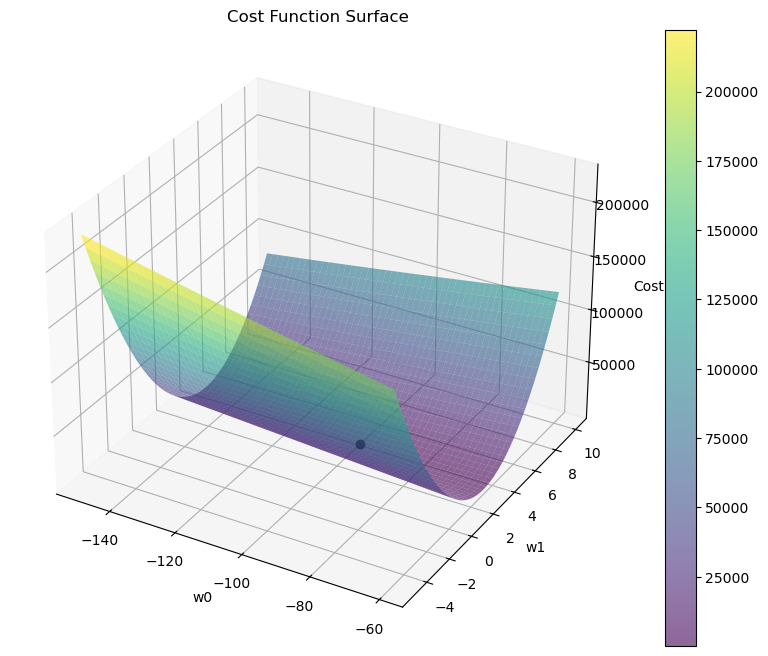

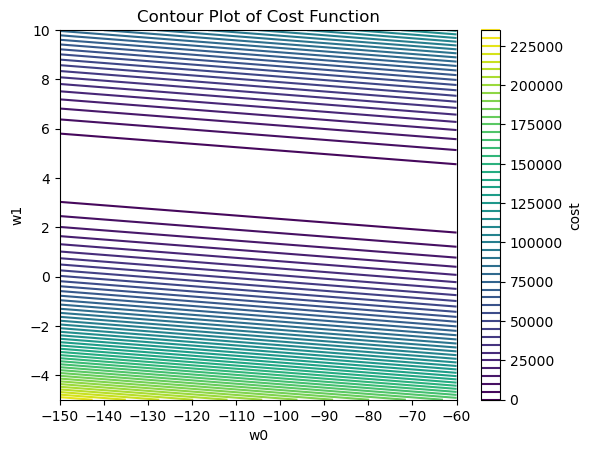

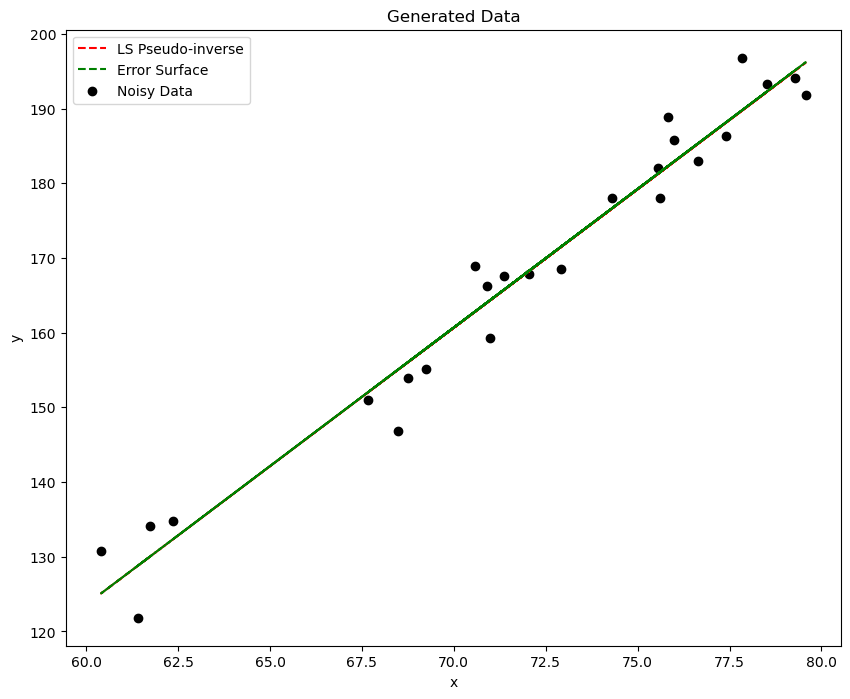

Before Adding Noise: w0(bias):-110.42 and w1:3.86

------------------Optimal value of w from diff methods----------------

From Error Surface: w0(bias):-98.91891891891892 and w1:3.708708708708709
From Least Squares: w0(bias):-98.78708856458223 and w1:3.706326158657514


In [21]:
########################################
#Generate meaningfull data
########################################
np.random.seed(0)
X_train = np.random.rand(25)*20+60
def geogeb(x):
    return 3.86*x - 110.42

Y = geogeb(X_train)

## Generate 25 random points from Gaussian distribution
mean = 0
std_dev = np.sqrt(20)
Y_train = Y  + np.random.normal(mean,std_dev,size= 25)

########################################
#Plot scatter plot of data
########################################
plt.figure(figsize=(10,8))
plt.plot(X_train ,Y,label="Without Noise",c = "black",alpha=0.1,marker=".")
plt.scatter(X_train,Y_train,label="With Noise",c = "red",marker="o")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Generated Data")
plt.legend()
plt.show()

########################################
#Weight estimation through error surface, i.e., empirically locate the minima of error surface
########################################
#Sample a bunch of w's around w_opt and compute the associated error
# Sample a range of w values
w0 = np.linspace(-150,-60, 1000)  # Specify `num`
w1 = np.linspace(-5,10,1000)
W0, W1 = np.meshgrid(w0, w1)

#Compute the error
def Error(w,t,x): #inputs : 1)weight:[w0,w1] 2)data i.e (t,x)
    #Estimate the target
    w = np.array(w)
    x = np.hstack((np.ones((len(x),1)),x.reshape((len(x),1))))
    t_pred = x @ w.T
    #Compute and return the error
    mse = np.mean((t-t_pred)**2)
    return 0.5*mse

#Plot 3D error surface and the corresponding contour plots
#Error surface is a function of w0 and w1
costs = []
for i in range(len(W0)):
    for j in range(len(W0[0])):
        cost = Error([W0[i,j],W1[i,j]],Y_train,X_train)
        costs.append(cost) 

costs = np.array(costs).reshape(W0.shape)

# Plot the 3D surface
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W0, W1, costs, cmap='viridis', alpha=0.6)
fig.colorbar(surf)
ax.set_xlabel('w0')
ax.set_ylabel('w1')
ax.set_zlabel('Cost')
plt.title('Cost Function Surface')

#Locate the minima of the error surface
#finding index of minimum value

min_indices = np.unravel_index(np.argmin(costs), costs.shape)
W0_min = W0[min_indices]
W1_min = W1[min_indices]
ax.plot(W0_min,W1_min,costs[min_indices],marker='o',color='black')
plt.show()


# Plotting contours for cost
plt.contour(W0, W1, costs, levels=50, cmap="viridis")  # Increase levels for smoother contours
plt.colorbar(label='cost')
plt.xlabel('w0')
plt.ylabel('w1')
plt.title('Contour Plot of Cost Function')
plt.show()


########################################
#Least squares approach to estimate the weights
########################################
#Complete the below linear regression function
def LinearRegression(X,Y): #inputs : 1)input data i.e (x). 2)target i.e (Y)
    # print(X.shape,X[0])
    X = np.hstack((np.ones((len(X), 1)), X.reshape((len(X), 1))))
    # print(X.shape,X[0])
    W_opt= np.linalg.inv(X.T @ X) @ (X.T@ Y)
    return W_opt

#Estimate optimal weight's using "LinearRegression" function
W_optimal = LinearRegression(X_train,Y_train)


#Estimate the targets using the input x and the estimated weights
X = np.hstack((np.ones((len(X_train), 1)), X_train.reshape((len(X_train), 1))))
Y_pred_LS =  X @ np.array(W_optimal).reshape((len(X[0]), 1))
Y_pred_error_surface =  X @ np.array([W0_min,W1_min]).reshape((len(X[0]), 1))


#Plot the estimated line on top of the above scatter plot
plt.figure(figsize=(10,8))
plt.plot(X_train ,Y_pred_LS,label="LS Pseudo-inverse",c = "red", linestyle="--")
plt.plot(X_train ,Y_pred_error_surface,label="Error Surface",c = "green", linestyle="--")
plt.scatter(X_train,Y_train,label="Noisy Data",c = "black",marker="o")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Generated Data")
plt.legend()
plt.show()

########################################
#Compare the estimated weight's using least squares approach with the error surface approach
########################################
print("Before Adding Noise: w0(bias):-110.42 and w1:3.86")
print("\n------------------Optimal value of w from diff methods----------------\n")
print(f"From Error Surface: w0(bias):{W0_min} and w1:{W1_min}")
print(f"From Least Squares: w0(bias):{W_optimal[0]} and w1:{W_optimal[1]}")

<b> Report your observations </b>

1. Optimal Weights considering Pseudo-inverse solution after linear regressing and from the error surface(loss fn = MSE) are almost same.Now As we are finding the minimum point from the graph, Its almost close to the analytic value of w_opt computed. However as the precision is limited in a graph, we dont get the exact value.
   \begin{equation}
   \nabla_w J(w) = X^T(t - Xw) = 0
   \end{equation}

\begin{equation}
w = (X^TX)^{-1}X^Tt
\end{equation}

2. Error surface J(w) is convex. The Errors increase as we deviate from w_opt and there exists only one minima(optimal w)

3. The Predicted lines of both the w_minima as well as w_opt seem to establish a near-perfect linear relation between the heights and weights as can be seen from the line fits. Also **both the lines seem to almost coincide**.


<h1><b>Part-2 : Understanding model order and overfitting</b></h1>


MSE on Training Data when using Polynomial Kernel(M =0): 0.7096377055157974
MSE on Testing Data when using Polynomial Kernel(M =0): 0.7570745931826096


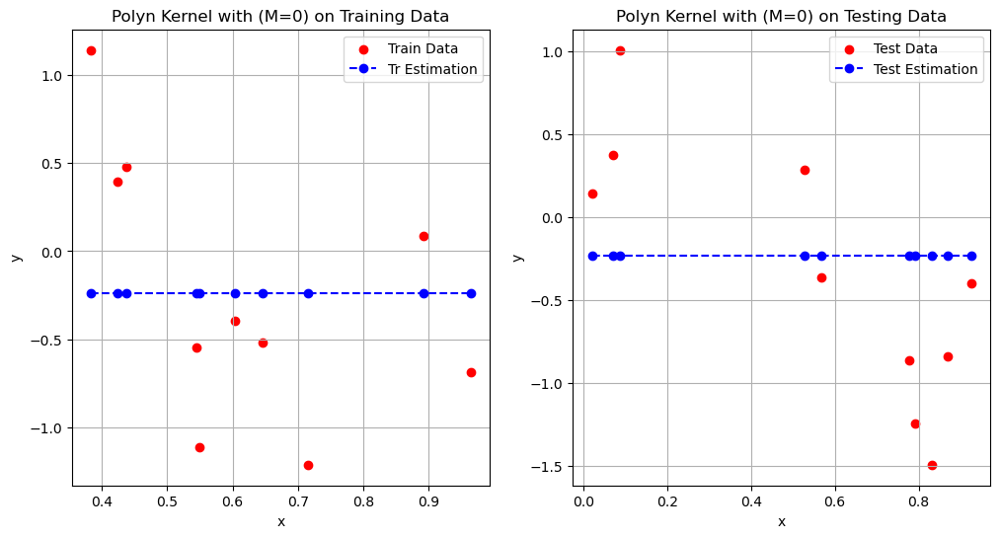

MSE on Training Data when using Polynomial Kernel(M =1): 0.6131613690378178
MSE on Testing Data when using Polynomial Kernel(M =1): 0.4973137294909259


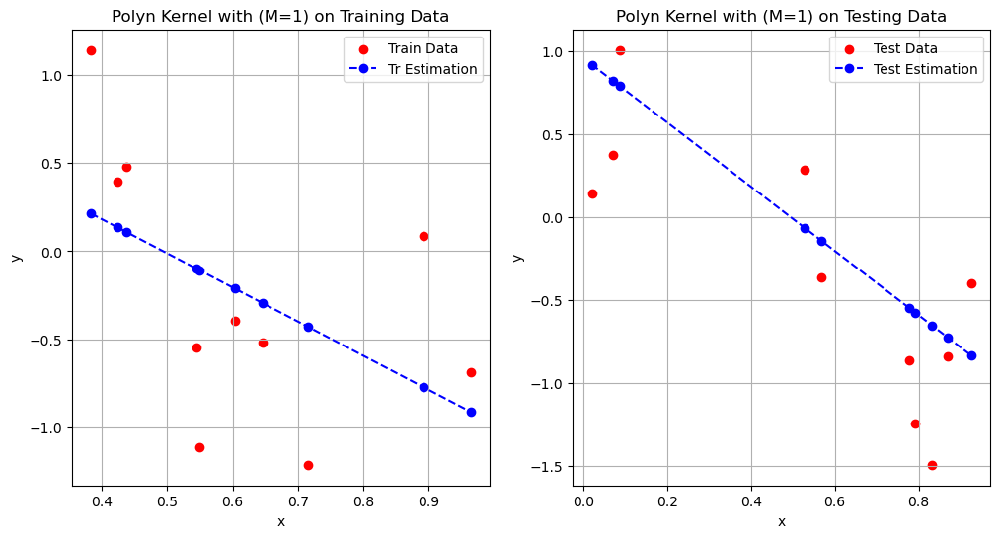

MSE on Training Data when using Polynomial Kernel(M =2): 0.3913673387943807
MSE on Testing Data when using Polynomial Kernel(M =2): 3.009217419734262


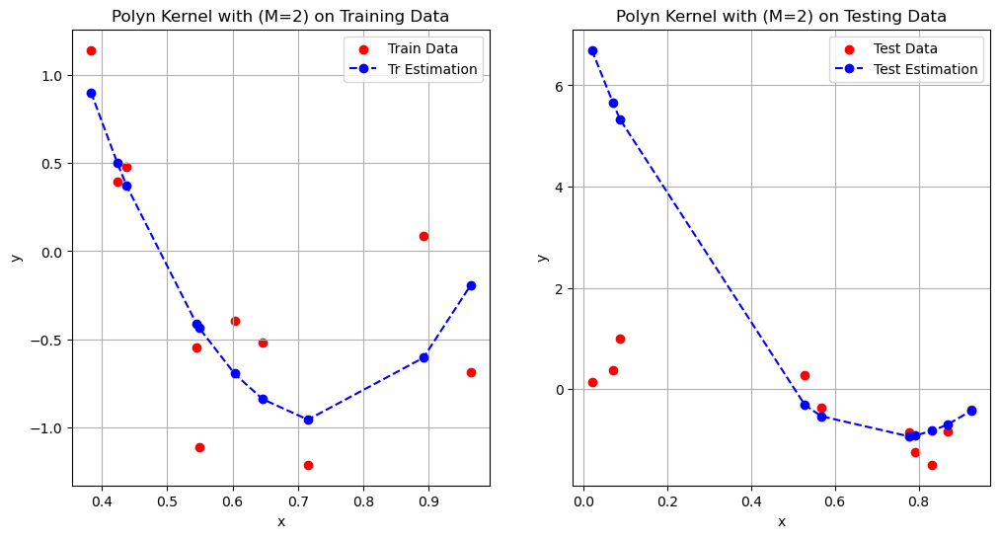

MSE on Training Data when using Polynomial Kernel(M =3): 0.3151624587899061
MSE on Testing Data when using Polynomial Kernel(M =3): 9.035216343004814


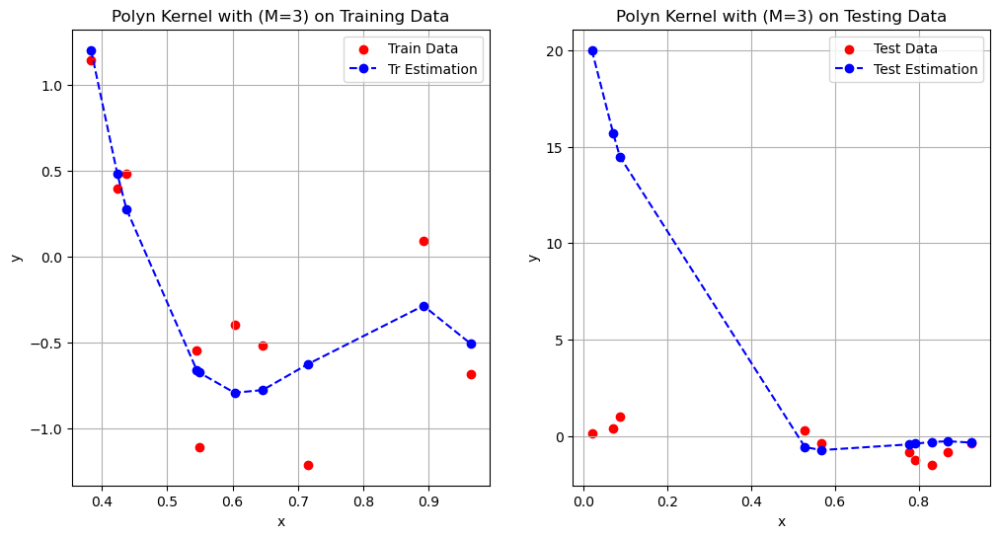

MSE on Training Data when using Polynomial Kernel(M =4): 0.3005486085739641
MSE on Testing Data when using Polynomial Kernel(M =4): 0.8088025399201775


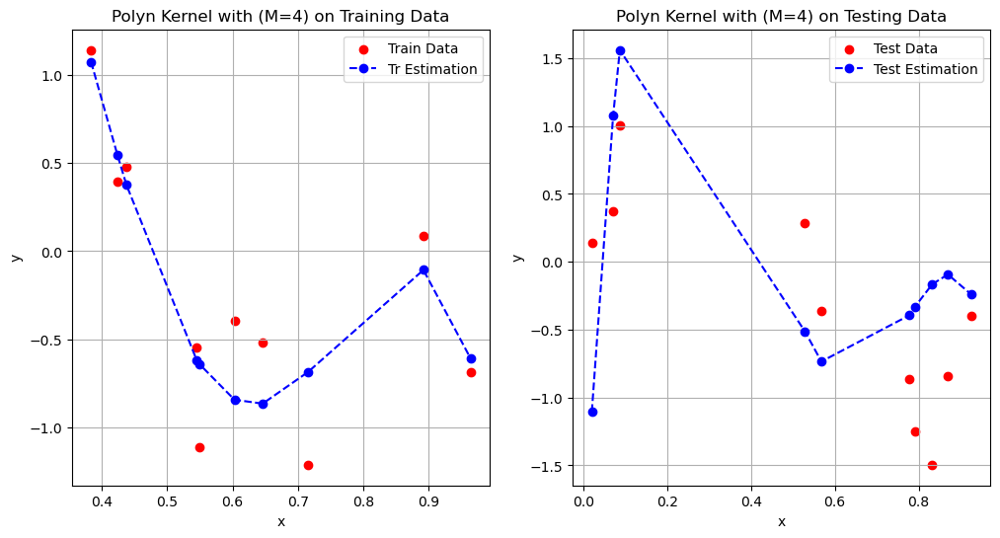

MSE on Training Data when using Polynomial Kernel(M =5): 0.27442801988268795
MSE on Testing Data when using Polynomial Kernel(M =5): 45.29842777247745


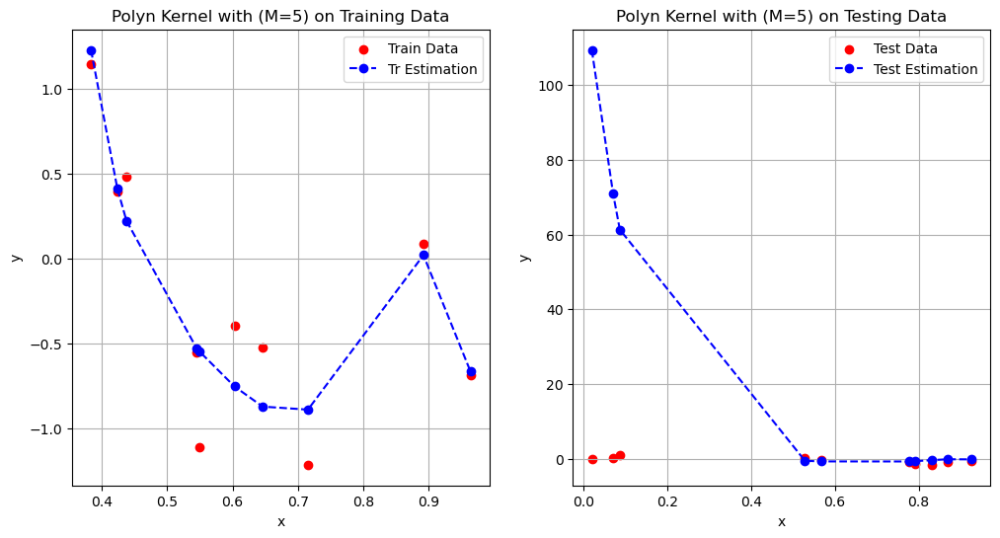

MSE on Training Data when using Polynomial Kernel(M =6): 0.16253248829591752
MSE on Testing Data when using Polynomial Kernel(M =6): 454.7860982556504


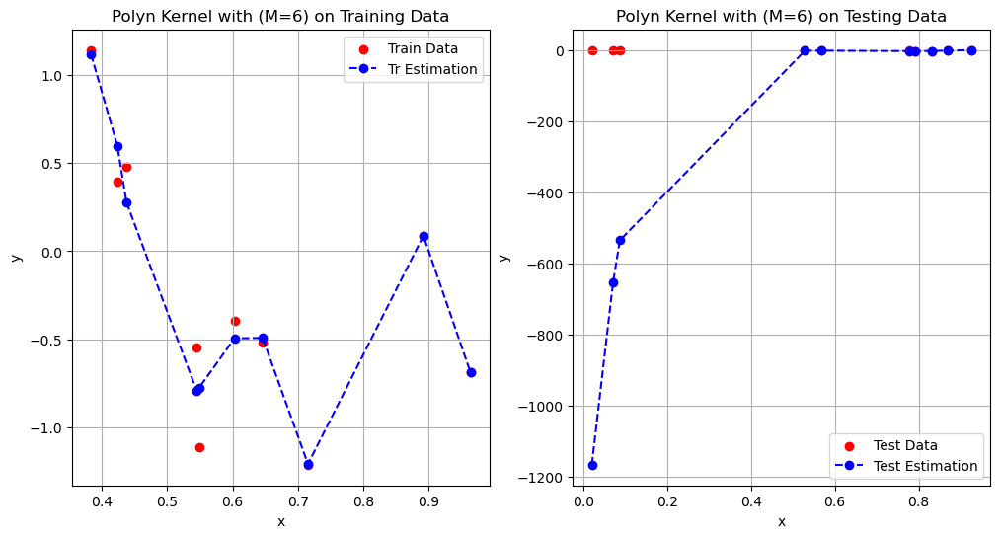

MSE on Training Data when using Polynomial Kernel(M =7): 0.160890189952478
MSE on Testing Data when using Polynomial Kernel(M =7): 292.1209062115252


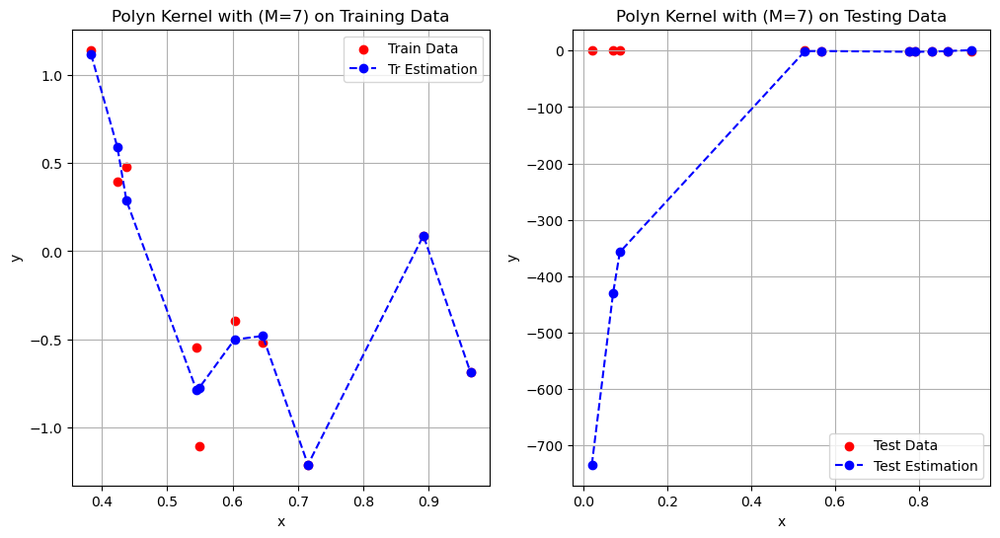

MSE on Training Data when using Polynomial Kernel(M =8): 0.15581293717019556
MSE on Testing Data when using Polynomial Kernel(M =8): 527.9313788776442


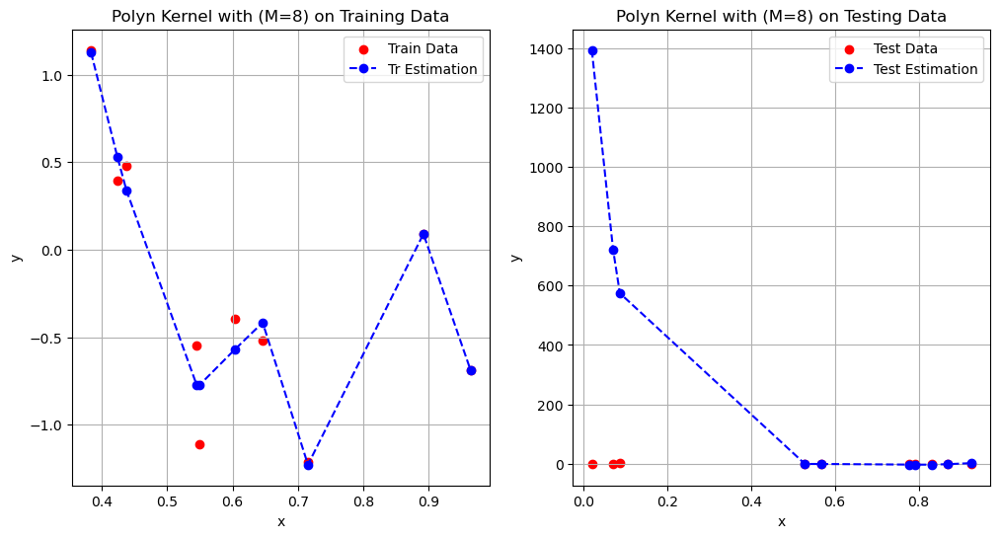

MSE on Training Data when using Polynomial Kernel(M =9): 0.15687055769523167
MSE on Testing Data when using Polynomial Kernel(M =9): 241.85299850528773


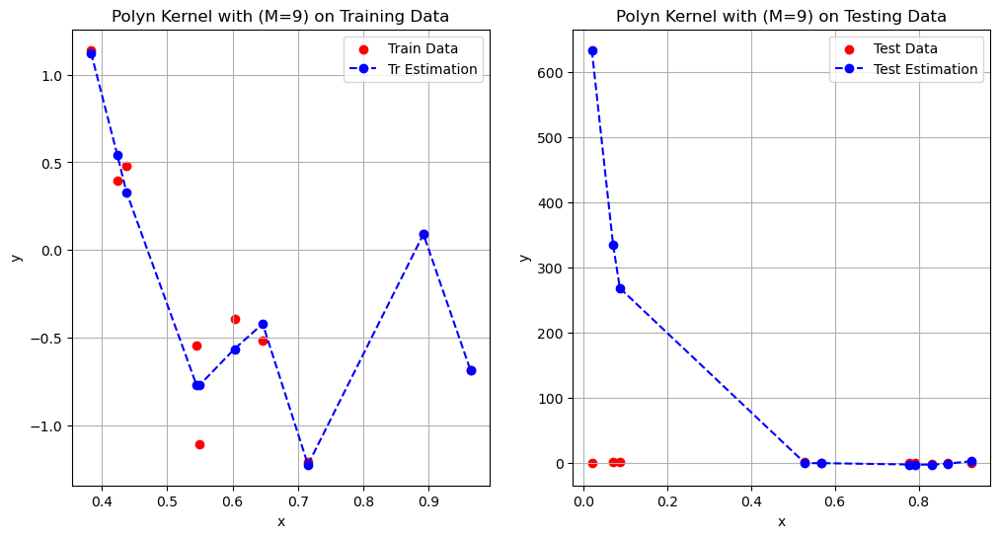

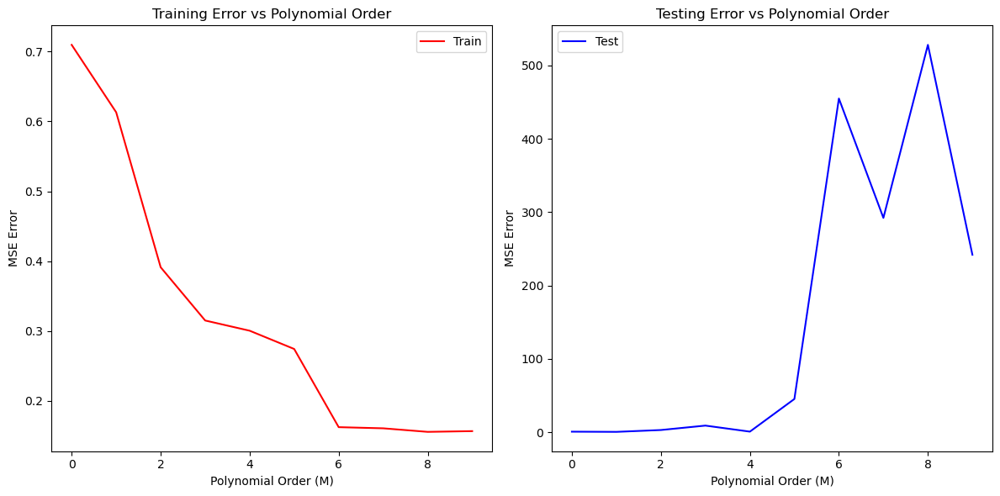

In [ ]:
#Understanding model order and overfitting
########################################
#Generate 20 data points
########################################
np.random.seed(0)
n=20
x = np.random.rand(n)*1

def y(x):
    n = len(x)
    return np.sin(2*np.pi*x) + np.random.normal(0,np.sqrt(0.1),n)

#Obtain train and test splits
x_train = np.sort(x[:n//2])
y_train = y(x_train)
x_test = np.sort(x[n//2:])
y_test = y(x_test)

########################################
#Fitting Mth degree polynomial using least squares approach
########################################
#Complete the function
def PolynomialKernel(X_train, X_test, M, lamda):  
    # Transform the training data using polynomial kernel  
    # print("Before Polynomial Kernel on Training Data: ", X_train.shape)  
    X_train = X_train.reshape((len(X_train), 1))
    X_test = X_test.reshape((len(X_test), 1))
    
    if(M>=0):
        X_train_transformed = np.ones((len(X_train), 1))
        X_test_transformed = np.ones((len(X_test), 1))                        
         
    if(M>=1):
        X_train_transformed = np.hstack((X_train_transformed, X_train))
        X_test_transformed = np.hstack((X_test_transformed, X_test))
  
    if(M>1):
        for i in range(2, M + 1):  
            x_i = (X_train ** i) 
            x_test_i = (X_test ** i)
            X_train_transformed = np.hstack((X_train_transformed, x_i))
            X_test_transformed = np.hstack((X_test_transformed, x_test_i))
        
    return X_train_transformed, X_test_transformed 

import numpy as np

def PolynomialFit(X_train_transformed, Y_train, lamda=0, bias_reg=False):
    """
    Polynomial regression with regularization using pseudo-inverse.

    Parameters:
    - X_train_transformed: Transformed training data (with polynomial features and bias term).
    - Y_train: Training targets.
    - lamda: Regularization coefficient.
    - bias_reg: Whether to apply regularization to the bias term.

    Returns:
    - w_opt: Optimal weights.
    """
    # number of features (including bias term)
    M = X_train_transformed.shape[1] -1

    # regularization matrix
    reg_matrix = lamda * np.eye(M+1 )  # Diagonal matrix with lamda on the diagonal

    # If bias_reg is False, set the first diagonal element (bias term) to 0
    if not bias_reg:
        reg_matrix[0, 0] = 0

    # optimal weights
    w_opt = np.linalg.pinv(X_train_transformed.T @ X_train_transformed + reg_matrix) @ \
            X_train_transformed.T @ Y_train.reshape((len(Y_train), 1))

    return w_opt


def PolynomialPred(w_est,X_train_transformed,X_test_transformed): #(weight,training data, training targets)
    # print(w_est.shape)
    train_pred = X_train_transformed @ w_est
    test_pred = X_test_transformed @ w_est
    
    #Return training and testing predictions
    return train_pred,test_pred


def PolynomialPred_Error(w_est,X_train_transformed,X_test_transformed,Y_train,Y_test): #(weight,training data, testing data, training targets, testing targets)
    # targets for both training and testing data
    train_pred,test_pred = PolynomialPred(w_est,X_train_transformed,X_test_transformed)
    train_err = np.sqrt(np.mean((train_pred.flatten() - Y_train) ** 2))
    test_err = np.sqrt(np.mean((test_pred.flatten() - Y_test) ** 2))
    
    return train_err,test_err

#Iterate through range of M values
M_range= np.array(range(10))
TrError = []
TeError = []
TrPred = []
TePred = []
ws_opt = []

X_train , X_test = PolynomialKernel(x_train, x_test, M_range[-1], 0)

for M in M_range:
    w_opt = PolynomialFit(X_train[:,:M+1],y_train)

    train_pred,test_pred=PolynomialPred(w_opt,X_train[:,:M+1],X_test[:,:M+1])
    train_pred = train_pred.flatten()
    test_pred = test_pred.flatten()
    TrPred.append(list(train_pred))
    TePred.append(list(test_pred))

    train_err,test_err = PolynomialPred_Error(w_opt,X_train[:,:M+1],X_test[:,:M+1],y_train,y_test)

    TrError.append(train_err)
    TeError.append(test_err)
    
#Plot training and testing estimates alogwith the original targets
for M in M_range:
    print(f"MSE on Training Data when using Polynomial Kernel(M ={M}): {TrError[M]}")
    print(f"MSE on Testing Data when using Polynomial Kernel(M ={M}): {TeError[M]}")
    
    plt.figure(figsize=(12,6))
    #plotting training
    plt.subplot(1,2,1)
    plt.scatter(x_train,y_train,label="Train Data",c="red",marker="o")
    plt.plot(x_train,TrPred[M],label="Tr Estimation",c="blue", linestyle="--",marker="o")
    plt.title(f"Polyn Kernel with (M={M}) on Training Data")
    plt.xlabel("x")
    plt.ylabel('y')
    plt.grid(True)
    plt.legend()
    
    #plotting testing
    plt.subplot(1,2,2)
    plt.scatter(x_test,y_test,label="Test Data",c="red", marker="o")
    plt.plot(x_test,TePred[M],label="Test Estimation",c="blue",linestyle="--",marker="o")
    plt.title(f"Polyn Kernel with (M={M}) on Testing Data")
    plt.xlabel("x")
    plt.ylabel('y')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(12, 6))

# Subplot for training error vs polynomial order
plt.subplot(1, 2, 1)
plt.plot(M_range, TrError, label="Train", c="red")
plt.title("Training Error vs Polynomial Order")
plt.xlabel("Polynomial Order (M)")
plt.ylabel("MSE Error")
plt.legend()

# Subplot for testing error vs polynomial order
plt.subplot(1, 2, 2)
plt.plot(M_range, TeError, label="Test", c="blue")
plt.title("Testing Error vs Polynomial Order")
plt.xlabel("Polynomial Order (M)")
plt.ylabel("MSE Error")
plt.legend()

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

MSE on Training Data when using Polynomial Kernel(M =0): 0.7196670002845
MSE on Testing Data when using Polynomial Kernel(M =0): 0.7713331817950266


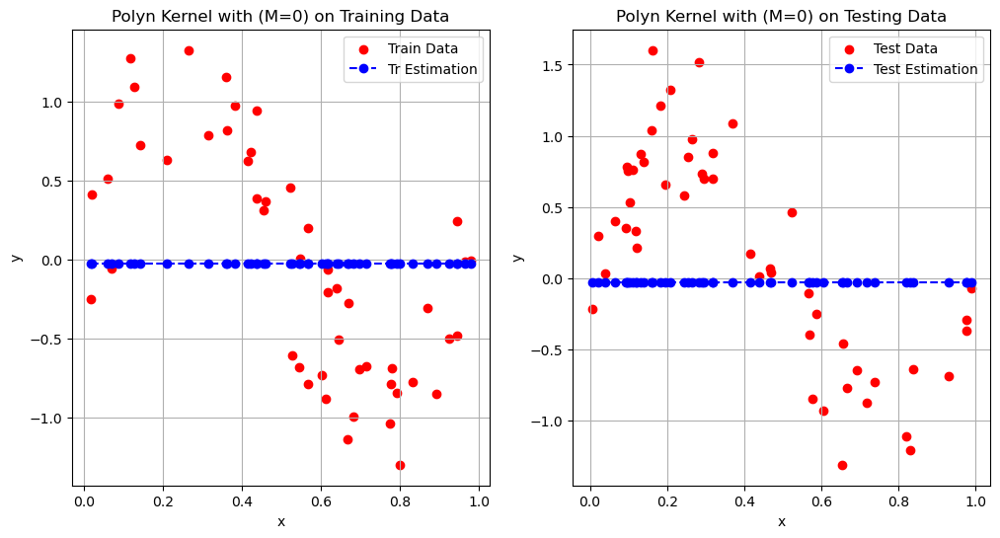

MSE on Training Data when using Polynomial Kernel(M =1): 0.5393560826458271
MSE on Testing Data when using Polynomial Kernel(M =1): 0.517677019069851


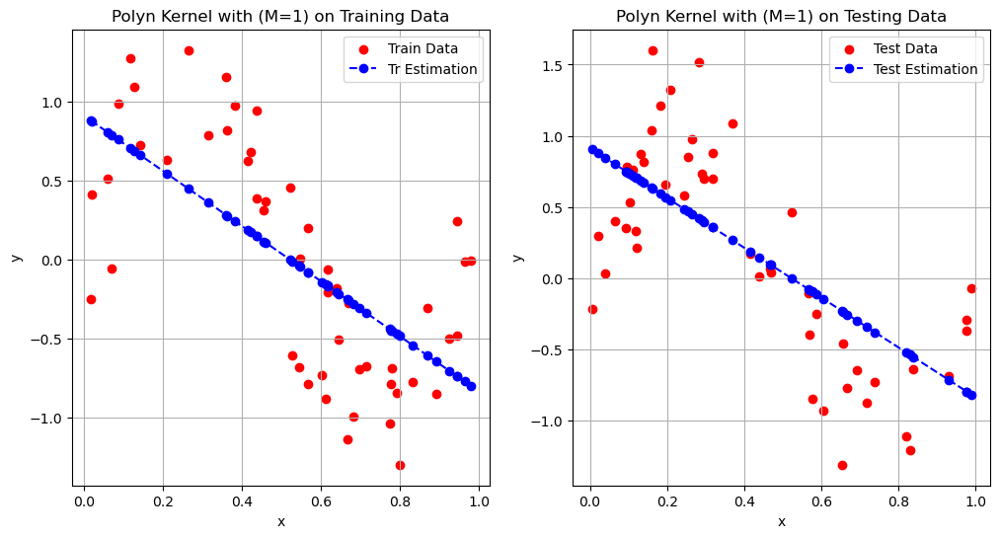

MSE on Training Data when using Polynomial Kernel(M =2): 0.53927145789377
MSE on Testing Data when using Polynomial Kernel(M =2): 0.5183822250961131


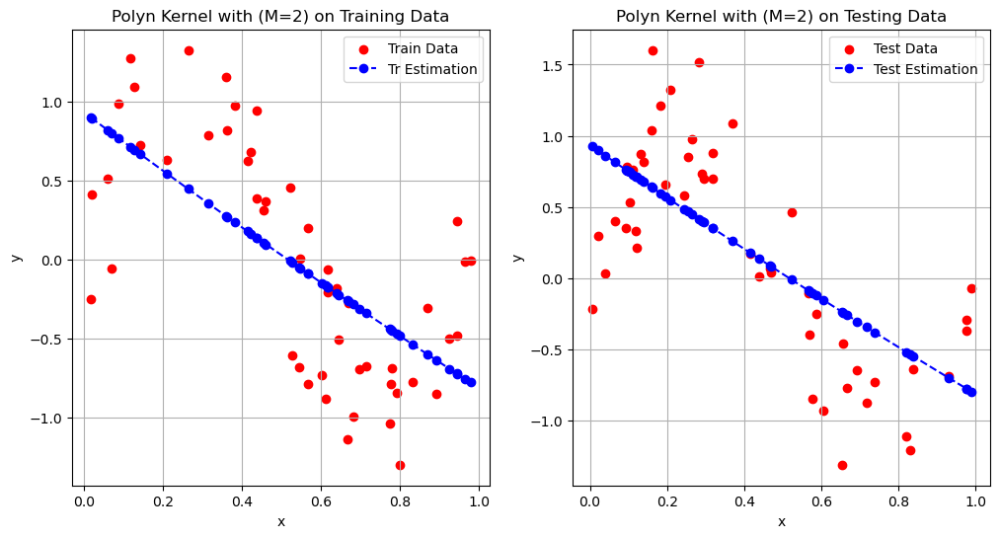

MSE on Training Data when using Polynomial Kernel(M =3): 0.3171873096412156
MSE on Testing Data when using Polynomial Kernel(M =3): 0.33188926967988663


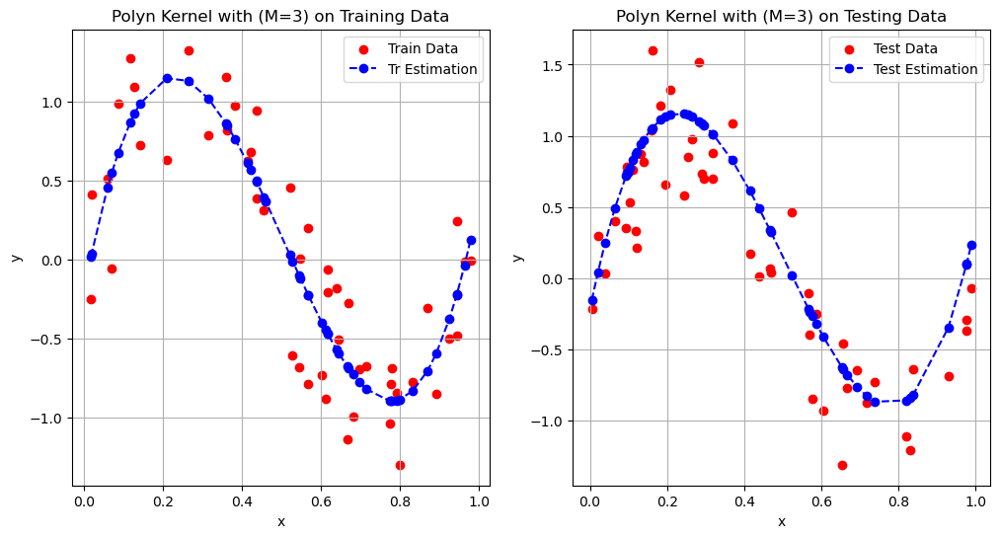

MSE on Training Data when using Polynomial Kernel(M =4): 0.31717927201809015
MSE on Testing Data when using Polynomial Kernel(M =4): 0.33203403937859227


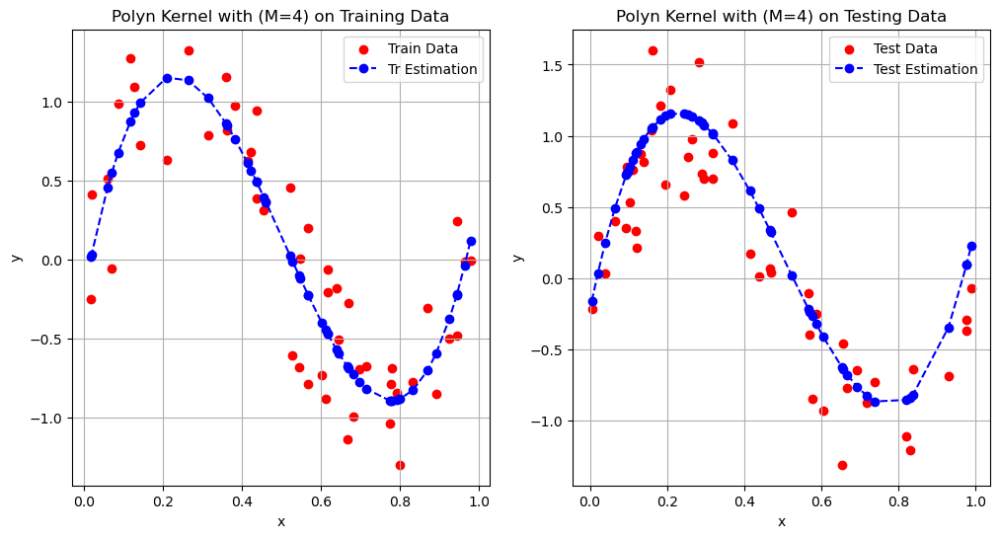

MSE on Training Data when using Polynomial Kernel(M =5): 0.31639215134675014
MSE on Testing Data when using Polynomial Kernel(M =5): 0.327607738340029


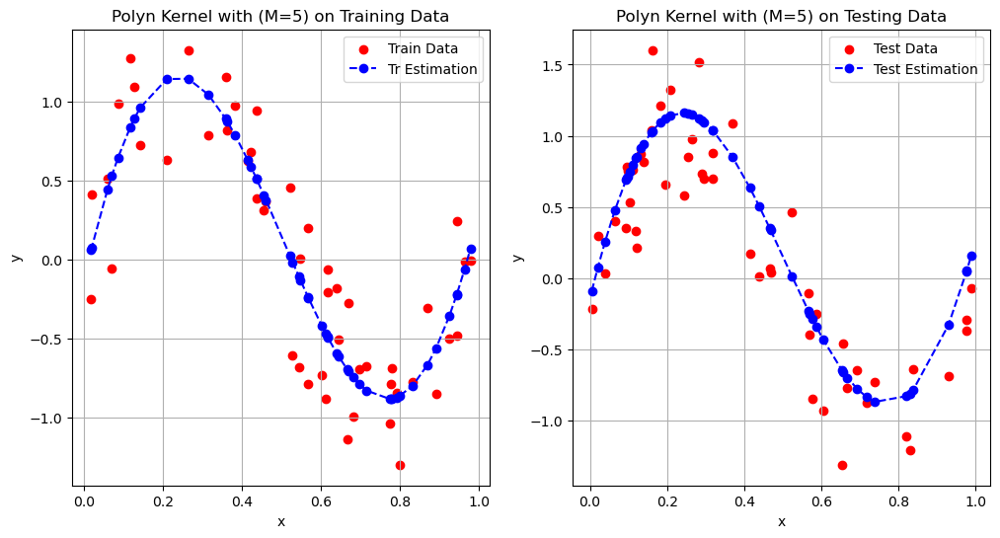

MSE on Training Data when using Polynomial Kernel(M =6): 0.31638767445961286
MSE on Testing Data when using Polynomial Kernel(M =6): 0.32731955673835944


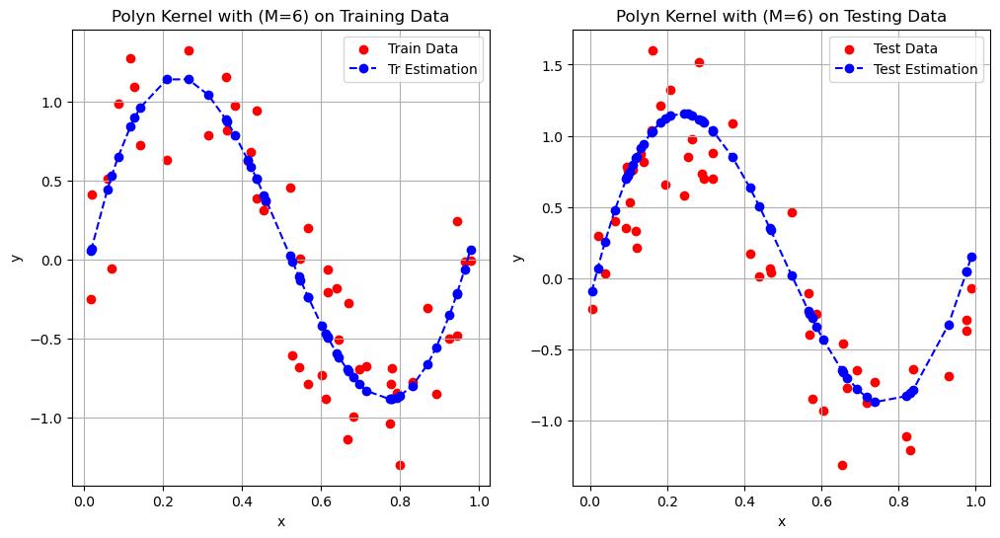

MSE on Training Data when using Polynomial Kernel(M =7): 0.315465609268364
MSE on Testing Data when using Polynomial Kernel(M =7): 0.33042729435112345


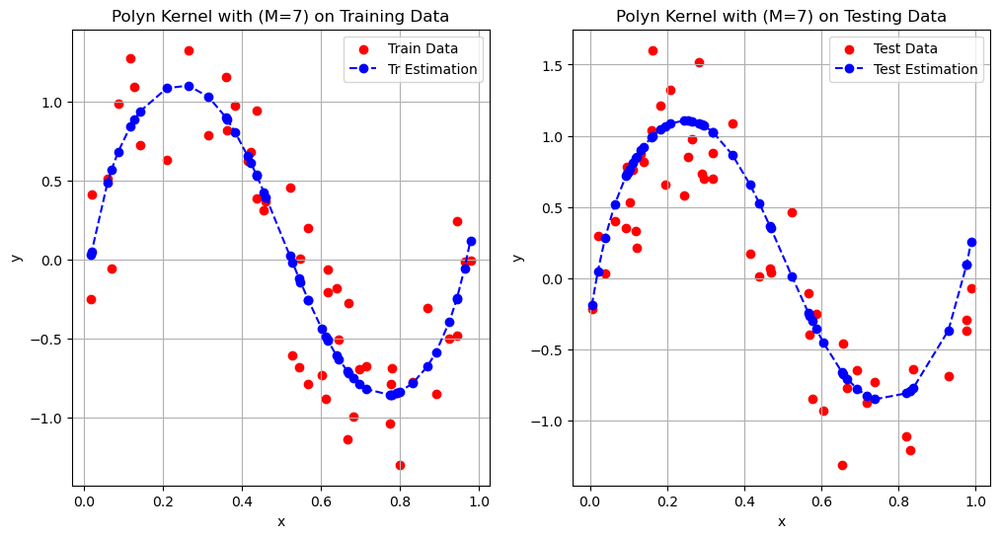

MSE on Training Data when using Polynomial Kernel(M =8): 0.31397839213129014
MSE on Testing Data when using Polynomial Kernel(M =8): 0.33074124855328535


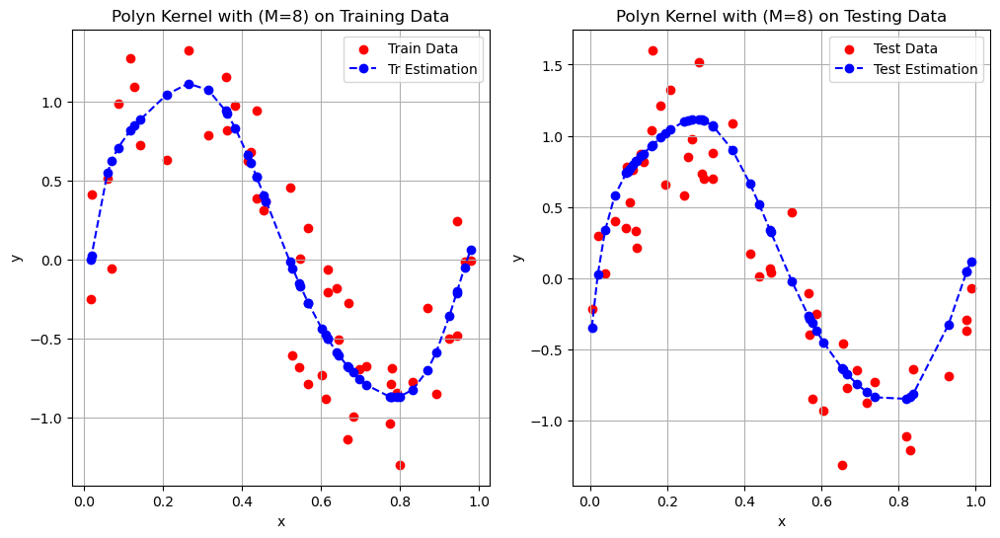

MSE on Training Data when using Polynomial Kernel(M =9): 0.30998461773369773
MSE on Testing Data when using Polynomial Kernel(M =9): 0.32410809355717685


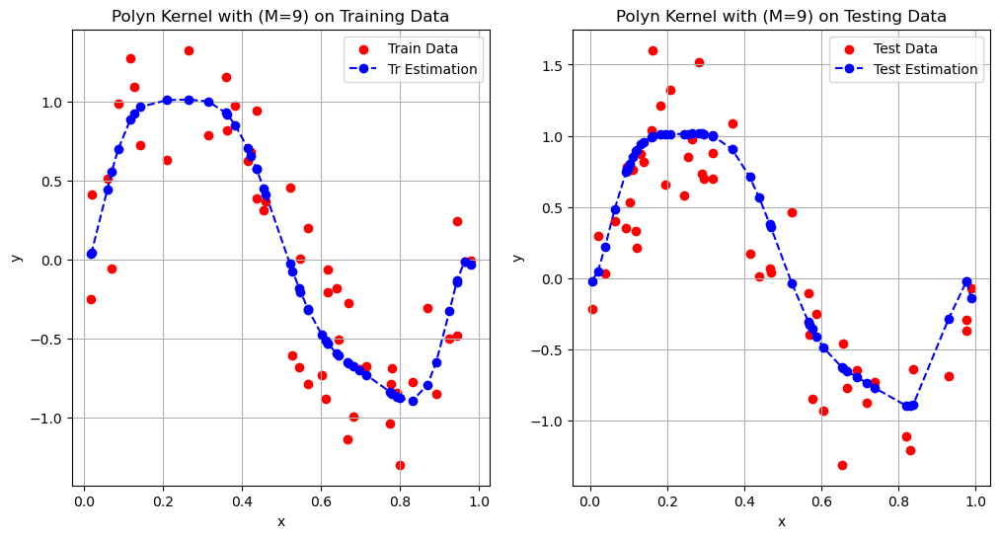

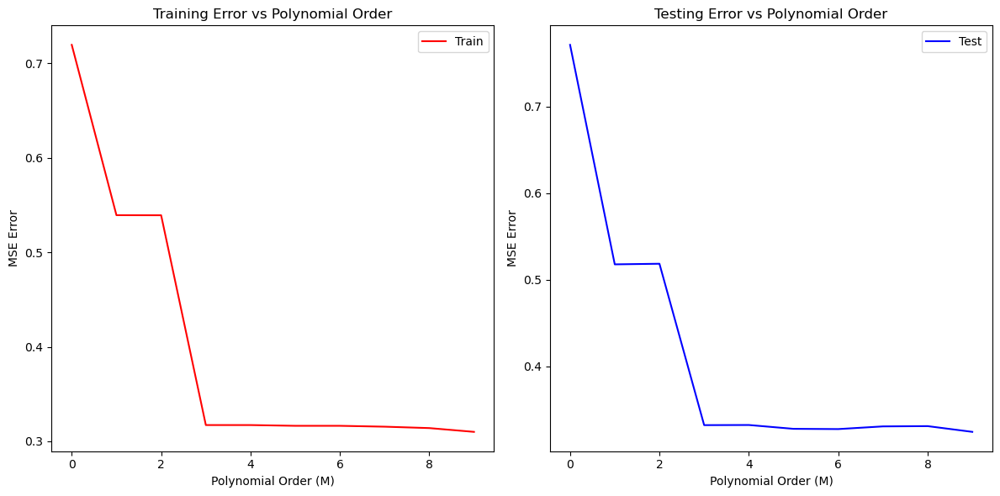

In [ ]:
# #######################################
# 2c)Increase the size of training data set to 100 points and repeat the experiments
# #######################################
np.random.seed(0)
n=100
x = np.random.rand(n)*1

x_train = np.sort(x[:n//2])
y_train = y(x_train)
x_test = np.sort(x[n//2:])
y_test = y(x_test)

M_range= np.array(range(10))
TrError = []
TeError = []
TrPred = []
TePred = []
ws_opt = []

X_train , X_test = PolynomialKernel(x_train, x_test, M_range[-1], 0)

for M in M_range:
    w_opt = PolynomialFit(X_train[:,:M+1],y_train)

    train_pred,test_pred=PolynomialPred(w_opt,X_train[:,:M+1],X_test[:,:M+1])
    train_pred = train_pred.flatten()
    test_pred = test_pred.flatten()
    TrPred.append(list(train_pred))
    TePred.append(list(test_pred))

    #Predict errors on both training and testing data using estimated w. Use the function "PolynomialPred_Error"
    train_err,test_err = PolynomialPred_Error(w_opt,X_train[:,:M+1],X_test[:,:M+1],y_train,y_test)

    TrError.append(train_err)
    TeError.append(test_err)
    
for M in M_range:
    print(f"MSE on Training Data when using Polynomial Kernel(M ={M}): {TrError[M]}")
    print(f"MSE on Testing Data when using Polynomial Kernel(M ={M}): {TeError[M]}")
    
    plt.figure(figsize=(12,6))
    #plotting training
    plt.subplot(1,2,1)
    plt.scatter(x_train,y_train,label="Train Data",c="red",marker="o")
    plt.plot(x_train,TrPred[M],label="Tr Estimation",c="blue", linestyle="--",marker="o")
    plt.title(f"Polyn Kernel with (M={M}) on Training Data")
    plt.xlabel("x")
    plt.ylabel('y')
    plt.grid(True)
    plt.legend()
    
    #plotting testing
    plt.subplot(1,2,2)
    plt.scatter(x_test,y_test,label="Test Data",c="red", marker="o")
    plt.plot(x_test,TePred[M],label="Test Estimation",c="blue",linestyle="--",marker="o")
    plt.title(f"Polyn Kernel with (M={M}) on Testing Data")
    plt.xlabel("x")
    plt.ylabel('y')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(12, 6))

# Subplot for training error vs polynomial order
plt.subplot(1, 2, 1)
plt.plot(M_range, TrError, label="Train", c="red")
plt.title("Training Error vs Polynomial Order")
plt.xlabel("Polynomial Order (M)")
plt.ylabel("MSE Error")
plt.legend()

# Subplot for testing error vs polynomial order
plt.subplot(1, 2, 2)
plt.plot(M_range, TeError, label="Test", c="blue")
plt.title("Testing Error vs Polynomial Order")
plt.xlabel("Polynomial Order (M)")
plt.ylabel("MSE Error")
plt.legend()

plt.tight_layout()
plt.show()

### Observation

### From 2a)

For **n = 20** (10 training samples and 10 testing samples), the following observations were made as the order of the polynomial kernel (**M**) was increased:

1. **Training Error**:

   - The training error continues to decrease as the polynomial order increases.
   - After \( M = 6 \), the training error becomes almost constant, showing that the model starts fitting the training data well.

2. **Testing Error**:
   - The testing error initially decreases up to \( M = 4 \), indicating better generalization.
   - After \( M = 4 \), the testing error increases dramatically and fluctuates, showing signs of overfitting. This means the model performs poorly on unseen testing data.

This behavior demonstrates that higher-order polynomials lead to overfitting, where the model captures noise in the training data rather than generalizing well to unseen data.

---

### Mean Squared Error (MSE) Data

| Polynomial Order (M) | Training Error (MSE) | Testing Error (MSE) |
| -------------------- | -------------------- | ------------------- |
| 0                    | 0.7096               | 0.7571              |
| 1                    | 0.6132               | 0.4973              |
| 2                    | 0.3914               | 3.0092              |
| 3                    | 0.3152               | 9.0352              |
| 4                    | 0.3005               | 0.8088              |
| 5                    | 0.2744               | 45.2984             |
| 6                    | 0.1625               | 454.7861            |
| 7                    | 0.1609               | 292.1209            |
| 8                    | 0.1558               | 527.9314            |
| 9                    | 0.1569               | 241.8530            |

---

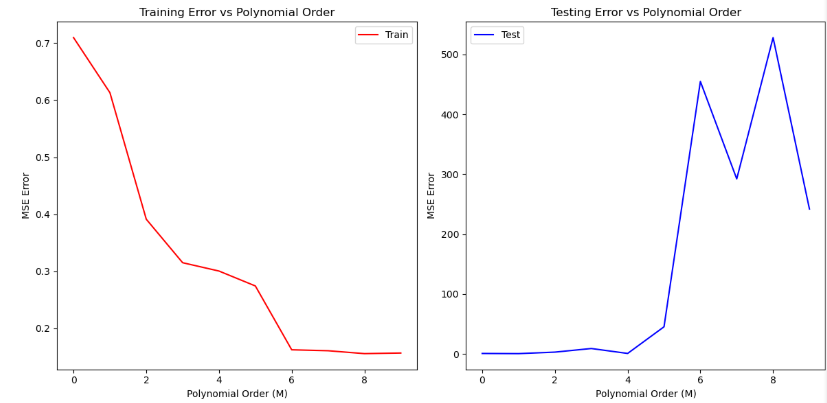

---

### From 2b)

For **n = 100** (50 training samples and 50 testing samples), the following observations were made as the order of the polynomial kernel (**M**) was increased:

As the polynomial order (\( M \)) increases from 0 to 9:

1. Both training error and testing error decrease significantly up to \( M = 3 \).
2. After \( M = 3 \), both errors become almost constant, indicating that increasing the model complexity beyond this point does not improve performance.

This behavior suggests that the model is effectively generalizing to unseen data, as the testing error remains low and stable after \( M = 3 \).

The results demonstrate that a polynomial kernel of order \( M = 3 \) is sufficient to capture the underlying patterns in the data without overfitting. Beyond this point, increasing the polynomial order does not provide additional benefits.

---

![Error vs Polynomial Order]ror v/s Polynomial Order](attachment:f1b78c43-2c27-4204-9d27-dd87cf94a290.png)
benefits.
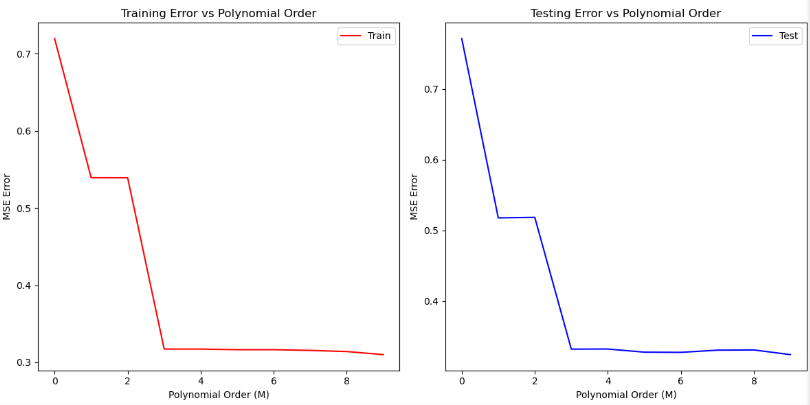fits.
s_Polynomial_Order.png)


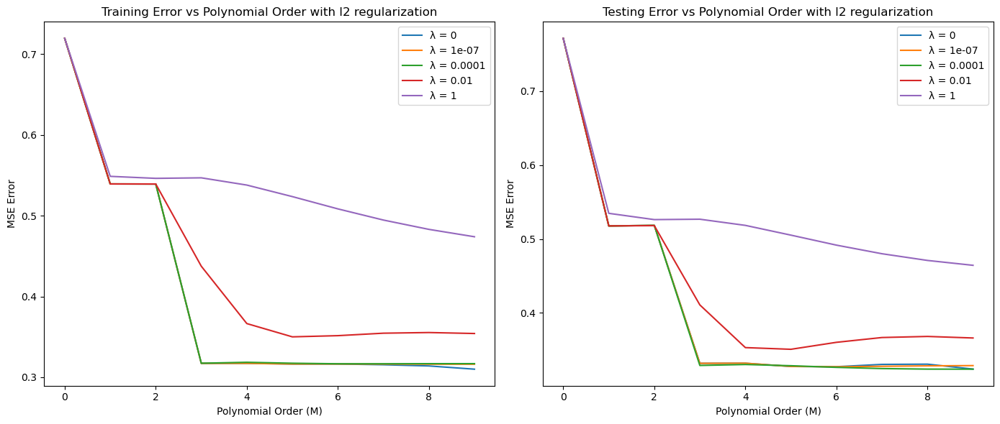

In [ ]:
# #######################################
# 2d) Effect of regularization
# #######################################
# Consider a set of lambda's
# Repeat the experiments, i.e., plot the prediction and error in predictions with respect to model order. Contrast these results with those obtained without regularization.

lamdas =  [0, 1e-7 , 1e-4, 1e-2, 1]
TrErrors = []
TeErrors = []
TrPreds = []
TePreds = []
ws_opts = []
for lamda in lamdas:
    TrError = []
    TeError = []
    TrPred = []
    TePred = []
    ws_opt = []
    
    X_train , X_test = PolynomialKernel(x_train, x_test, M_range[-1], 0)
    
    for M in M_range:
    
        w_opt = PolynomialFit(X_train[:,:M+1],y_train,lamda)
    
        #Predict training and testing targets
        train_pred,test_pred=PolynomialPred(w_opt,X_train[:,:M+1],X_test[:,:M+1])
        train_pred = train_pred.flatten()
        test_pred = test_pred.flatten()
        TrPred.append(list(train_pred))
        TePred.append(list(test_pred))
    
        #Predict errors on both training and testing data using estimated w. Use the function "PolynomialPred_Error"
        train_err,test_err = PolynomialPred_Error(w_opt,X_train[:,:M+1],X_test[:,:M+1],y_train,y_test)
    
    
        TrError.append(train_err)
        TeError.append(test_err)
    TrErrors.append(TrError)
    TeErrors.append(TeError)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
for i, lamda in enumerate(lamdas):
    plt.plot(M_range, TrErrors[i], label=f"λ = {lamda}")
plt.title("Training Error vs Polynomial Order with l2 regularization")
plt.xlabel("Polynomial Order (M)")
plt.ylabel("MSE Error")
plt.legend()

plt.subplot(1, 2, 2)
for i, lamda in enumerate(lamdas):
    plt.plot(M_range, TeErrors[i], label=f"λ = {lamda}")
plt.title("Testing Error vs Polynomial Order with l2 regularization")
plt.xlabel("Polynomial Order (M)")
plt.ylabel("MSE Error")
plt.legend()

plt.tight_layout()
plt.show()

**Left Plot (Training Error vs Polynomial Order):**

1. The plot shows how training error decreases as polynomial order increases, with different lines representing different regularization strengths (λ values).
2. When λ = 0 (blue line), the training error drops dramatically as polynomial order increases, indicating potential overfitting to the training data.
3. As λ increases (0.0001, 0.01, 1), the training error reduction becomes less pronounced, showing the regularization effect restricting model complexity.
4. The purple line (λ = 1) maintains the highest training error across all polynomial orders, indicating strong regularization that prevents the model from fitting the training data too closely.

**Right Plot (Testing Error vs Polynomial Order):**

1. For λ = 0 (blue line), the testing error increases dramatically at higher polynomial orders (>4), showing severe overfitting.
2. Models with stronger regularization (λ = 0.0001, 0.01, 1) maintain consistently low testing error across all polynomial orders.
3. The λ = 1e-07 (orange line) shows slightly better performance than λ = 0 but still shows signs of overfitting at higher polynomial orders.

**Overall Observations:**

1. There's a clear trade-off between training and testing performance.
2. Higher regularization strengths (especially λ = 0.0001 and λ = 0.01) provide the best balance of low testing error while maintaining reasonable training error.
3. The optimal polynomial order appears to be around 4-6, where models with moderate regularization achieve good performance without overfitting.
4. This demonstrates how L2 regularization effectively controls model complexity and prevents overfitting in polynomial regression.


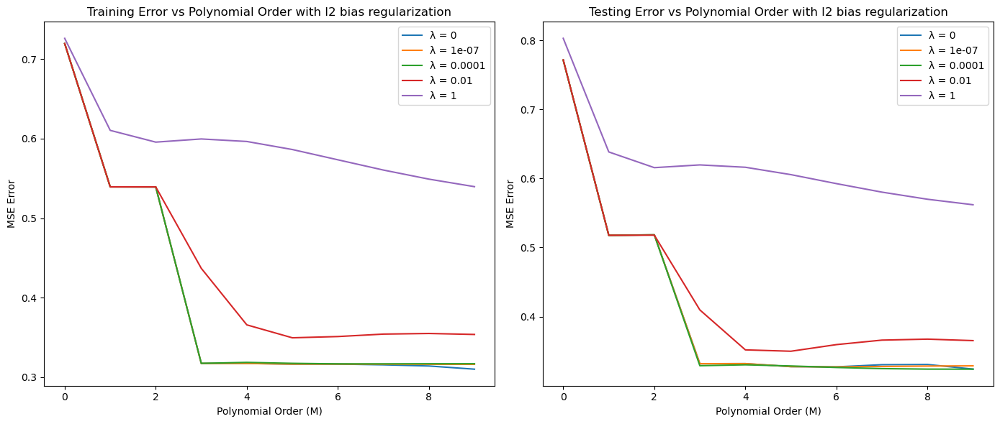

In [ ]:
# #######################################
# 2e) Effect of bias regularization
# #######################################
# Modify the function i.e include bias
# Generate data

np.random.seed(0)
n=100
x = np.random.rand(n)*1

def y(x):
    n = len(x)
    return 5 + np.sin(2*np.pi*x) + np.random.normal(0,np.sqrt(0.1),n)

x_train = np.sort(x[:n//2])
y_train = y(x_train)
x_test = np.sort(x[n//2:])
y_test = y(x_test)

lamdas =  [0, 1e-7 , 1e-4, 1e-2, 1]
TrErrors = []
TeErrors = []
TrPreds = []
TePreds = []
ws_opts = []
for lamda in lamdas:
    TrError = []
    TeError = []
    TrPred = []
    TePred = []
    ws_opt = []
    
    X_train , X_test = PolynomialKernel(x_train, x_test, M_range[-1], 0)
    
    for M in M_range:
        w_opt = PolynomialFit(X_train[:,:M+1],y_train,lamda,True)
    
        train_pred,test_pred=PolynomialPred(w_opt,X_train[:,:M+1],X_test[:,:M+1])
        train_pred = train_pred.flatten()
        test_pred = test_pred.flatten()
        TrPred.append(list(train_pred))
        TePred.append(list(test_pred))
    
        #Predict errors on both training and testing data using estimated w. Use the function "PolynomialPred_Error"
        train_err,test_err = PolynomialPred_Error(w_opt,X_train[:,:M+1],X_test[:,:M+1],y_train,y_test)
    
        TrError.append(train_err)
        TeError.append(test_err)
    TrErrors.append(TrError)
    TeErrors.append(TeError)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
for i, lamda in enumerate(lamdas):
    plt.plot(M_range, TrErrors[i], label=f"λ = {lamda}")
plt.title("Training Error vs Polynomial Order with l2 bias regularization")
plt.xlabel("Polynomial Order (M)")
plt.ylabel("MSE Error")
plt.legend()

plt.subplot(1, 2, 2)
for i, lamda in enumerate(lamdas):
    plt.plot(M_range, TeErrors[i], label=f"λ = {lamda}")
plt.title("Testing Error vs Polynomial Order with l2 bias regularization")
plt.xlabel("Polynomial Order (M)")
plt.ylabel("MSE Error")
plt.legend()

plt.tight_layout()
plt.show()

<b> Report your observations </b>

\*\*Left Plot (Training Error vs Polynomial Order):

1. The plot shows how training error changes as polynomial order increases, with different regularization strengths (λ values).
2. Unlike standard L2 regularization, this appears to focus on bias terms.
3. When λ = 0 (blue line) and λ = 1e-07 (orange line), they follow similar patterns, suggesting minimal impact of very low regularization.
4. The λ = 0.0001 (green line) and λ = 0.01 (red line) show substantial error reduction at polynomial order 3-4, then stabilize.
5. The λ = 1 (purple line) maintains the highest training error throughout, indicating strong regularization limiting model flexibility.

**Right Plot (Testing Error vs Polynomial Order):**

1. All regularization strengths show initial high testing error that drops significantly as polynomial order increases from 0 to 2.
2. The λ = 1 (purple line) maintains the highest testing error throughout, showing overly restricted model capacity.
3. The moderate regularization strengths (λ = 0.0001 and λ = 0.01) achieve the lowest testing errors at polynomial orders around 3-4.
4. Unlike the previous plot set, there's no dramatic increase in testing error at higher polynomial orders for λ = 0.

**Overall Observations:**

1. Bias regularization appears to produce more stable testing performance across polynomial orders compared to standard L2 regularization.
2. Moderate regularization strengths (λ = 0.0001 and λ = 0.01) provide the best balance between training and testing performance.
3. The optimal polynomial order appears to be around 3-4, where models with moderate regularization achieve minimum testing error.
4. The absence of dramatic overfitting (increasing test error) at higher polynomial orders suggests bias regularization may control complexity differently than standard L2 regularization.
5. There's a clearer pattern of diminishing returns in both training and testing error as polynomial order increases.


<h1><b>Part 3 :Understanding the choice of kernel</b></h1>


### Generating data noisy sigmoidal data


In [ ]:
########################################
#Generate 100 data points
########################################
import numpy as np

np.random.seed(0)  
n = 100

# Generate x values for training and testing separately
x_train = np.random.rand(n // 2) * 1  # 50 values between 0 and 1 for training
x_test = np.random.rand(n // 2) * 1   # 50 values between 0 and 1 for testing

mean = 0
var = 0.1
err = np.random.normal(mean, np.sqrt(var), n)

def sinusoidal(x):
    return np.sin(2 * np.pi * x)

# Generate target values with noise for training and testing
y_train = sinusoidal(x_train) + err[:n // 2]
y_test = sinusoidal(x_test) + err[n // 2:]

train_sort_idx = np.argsort(x_train)
x_train = x_train[train_sort_idx]
y_train = y_train[train_sort_idx]

test_sort_idx = np.argsort(x_test)
x_test = x_test[test_sort_idx]
y_test = y_test[test_sort_idx]

print(x_train.shape,x_test.shape,y_train.shape,y_test.shape)

(50,) (50,) (50,) (50,)


### Kernel Transformation & Regression & Plotting losses for Different M


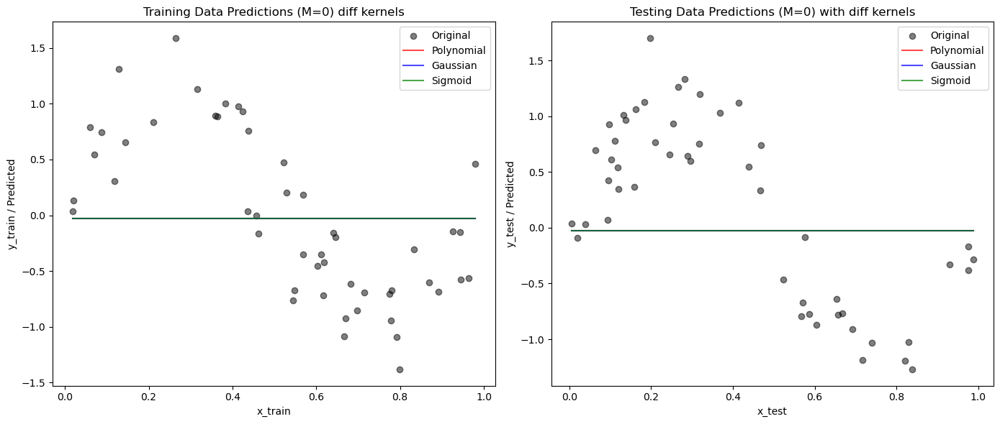

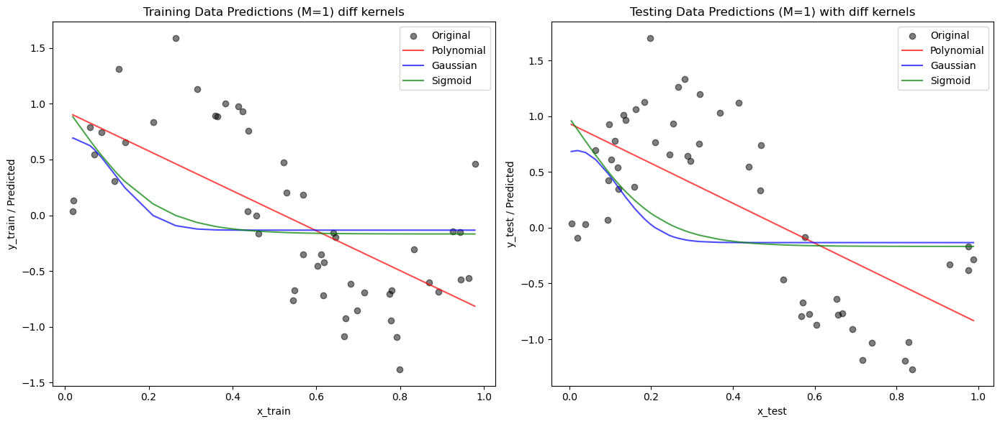

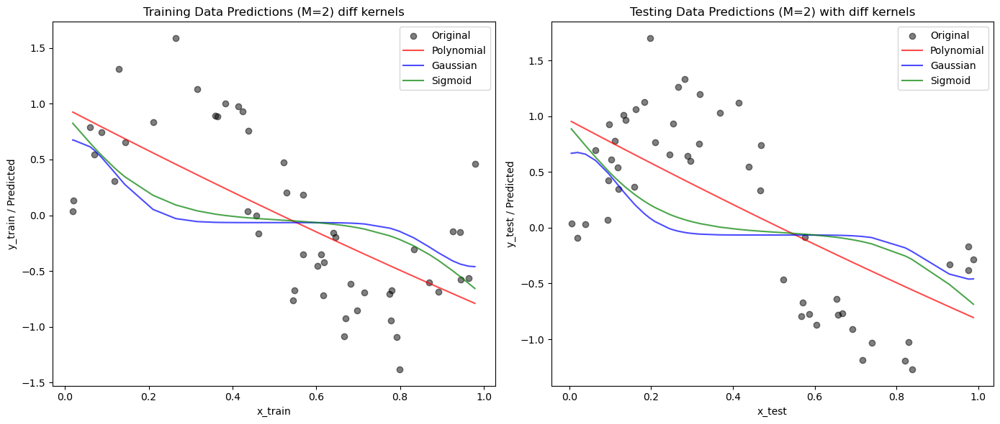

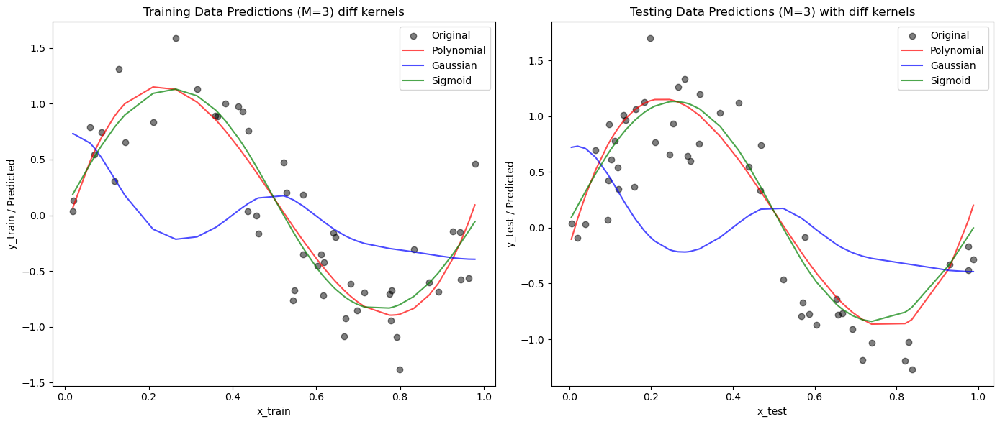

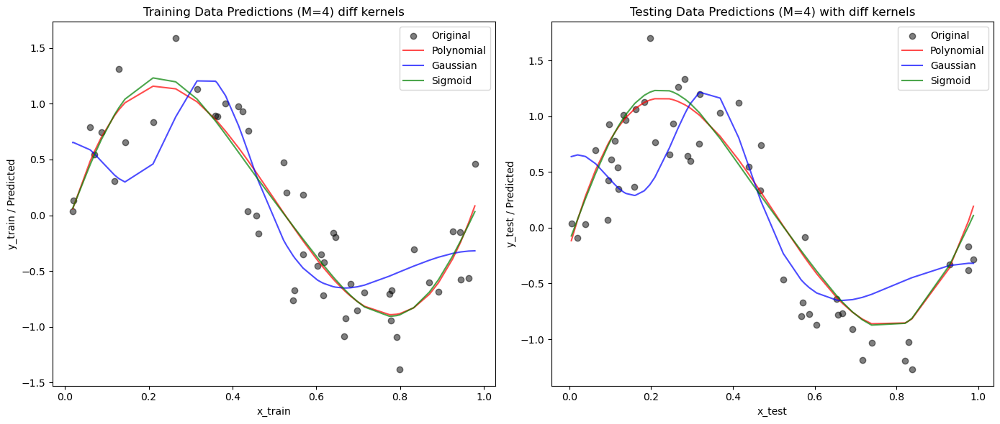

...

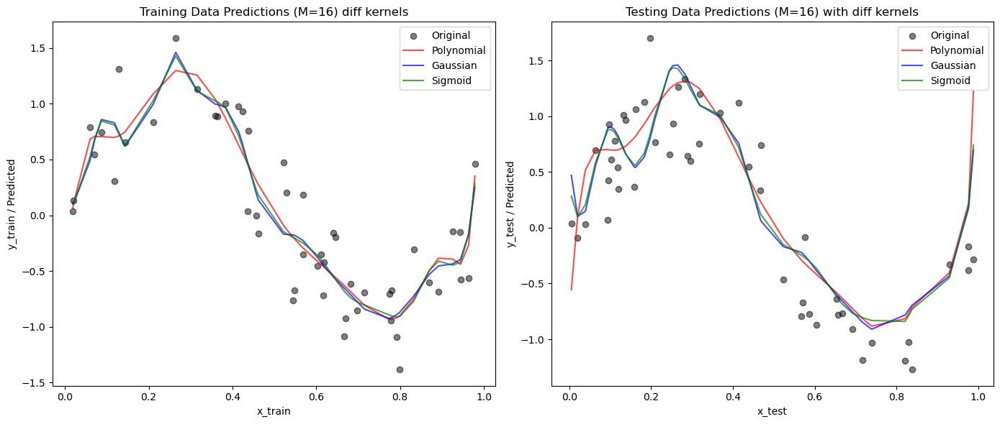

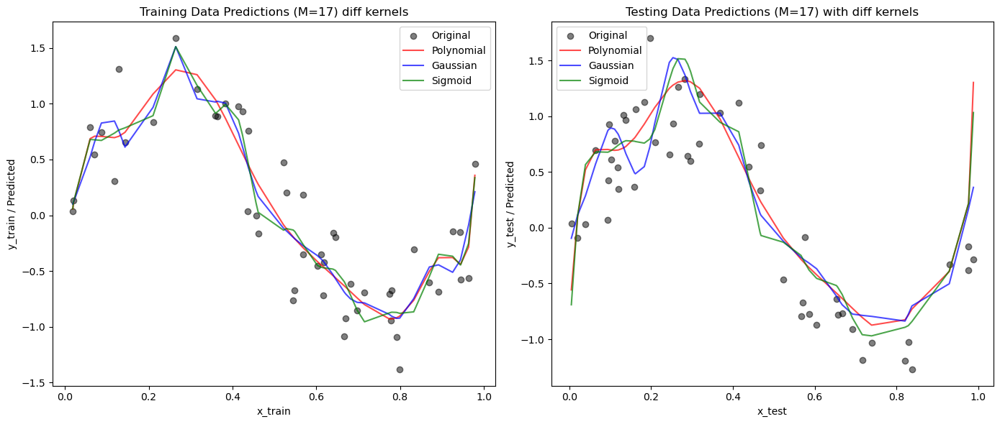

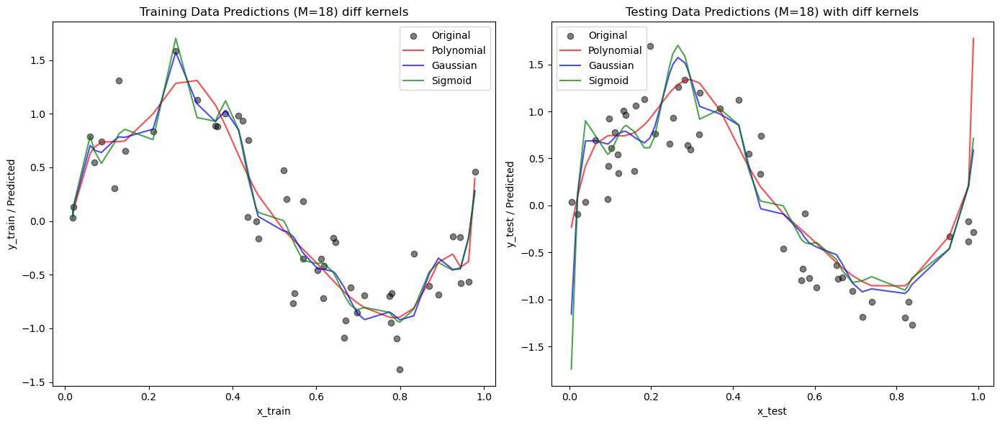

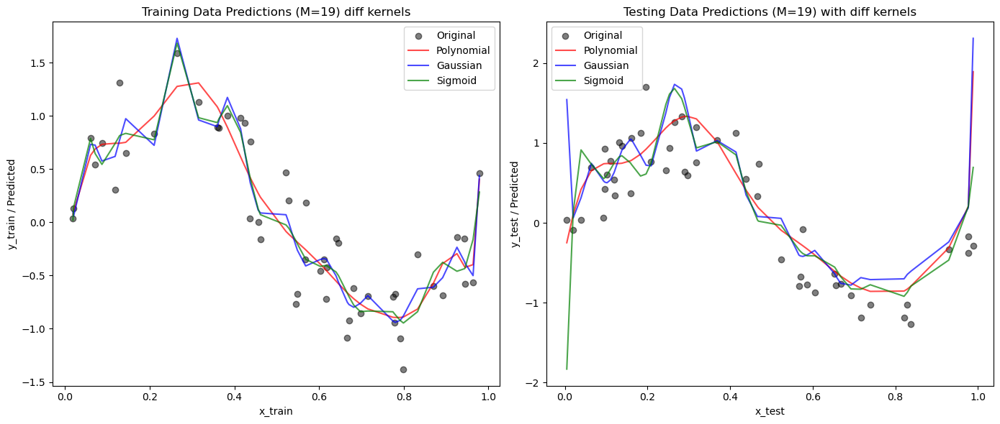

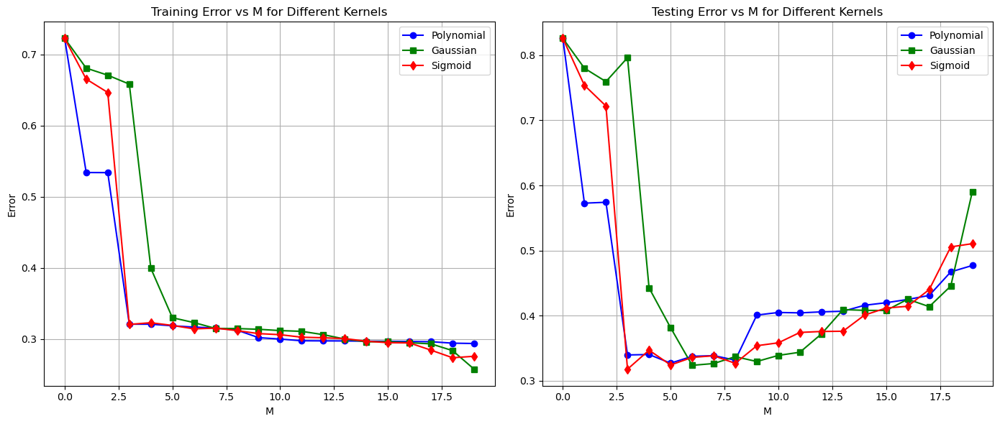

In [ ]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def KernelTransform(X_train, X_test, M, kernelType="polynomial"):
    """Return (N, M+1) transformed data from (N,) using different kernels."""
    
    N_train = len(X_train)
    N_test = len(X_test)
    X_train = X_train.flatten()
    X_test = X_test.flatten()

    X_train_transformed = np.ones((N_train, M + 1))
    X_test_transformed = np.ones((N_test, M + 1))
    
    if kernelType == 'polynomial':
        for i in range(1, M + 1):
            X_train_transformed[:, i] = X_train ** i
            X_test_transformed[:, i] = X_test ** i
    
    elif kernelType == 'gaussian':
        mu = np.linspace(np.min(X_train), np.max(X_train), M)  
        sigma = 0.1  # Standard deviation for gaussian basis fnx
        
        for i, center in enumerate(mu):
            X_train_transformed[:, i + 1] = np.exp(-((X_train - center) ** 2) / (2 * sigma ** 2))
            X_test_transformed[:, i + 1] = np.exp(-((X_test - center) ** 2) / (2 * sigma ** 2))
    
    elif kernelType == 'sigmoidal':
        # Sigmoidal (tanh) kernel transformation
        centers = np.linspace(np.min(X_train), np.max(X_train), M)  # Define M centers
        sigma = 0.1  # Spread of the sigmoid
        
        for i, center in enumerate(centers):
            X_train_transformed[:, i + 1] = sigmoid((X_train - center) / sigma)
            X_test_transformed[:, i + 1] = sigmoid((X_test - center) / sigma)
    
    else:
        raise ValueError("Invalid kernelType. Choose from 'polynomial', 'gaussian', or 'sigmoidal'.")

    return X_train_transformed, X_test_transformed



def KernelRegressionPred_Error(X_train, Y_train, X_test, Y_test, M, kernelType, lamda=0):
    """return pseudo inverse weight and errors and prediction"""
    assert len(X_train) == len(Y_train)
    assert len(X_test) == len(Y_test)
    Y_train = np.reshape(Y_train, (-1, 1))
    Y_test = np.reshape(Y_test, (-1, 1))

    X_train_transformed, X_test_transformed = KernelTransform(X_train, X_test, M, kernelType)

    # Estimate weights using the pseudo-inverse solution
    w_est = np.linalg.pinv(X_train_transformed.T @ X_train_transformed + lamda * np.eye(M + 1)) @ X_train_transformed.T @ Y_train

    # Predict training and testing targets
    y_train_pred = X_train_transformed @ w_est
    y_test_pred = X_test_transformed @ w_est

    # Compute errors (RMSE)
    tr_error = np.sqrt(np.mean((Y_train - y_train_pred)**2))
    te_error = np.sqrt(np.mean((Y_test - y_test_pred)**2))

    return w_est, tr_error, te_error,y_train_pred ,y_test_pred

# Iterate through range of M values
M_range = list(range(20))

polynomial_tr_error = []
polynomial_te_error = []
gaussian_tr_error = []
gaussian_te_error = []
sigmoid_tr_error = []
sigmoid_te_error = []
polynomial_tr_pred = []
polynomial_te_pred = []
gaussian_tr_pred = []
gaussian_te_pred = []
sigmoid_tr_pred = []
sigmoid_te_pred = []

for M in M_range:
    for kernelType in ['gaussian','sigmoidal','polynomial']: 
        
        # w_opt , errors on both training and testing data with diff M
        w_est, tr_error, te_error, y_train_pred, y_test_pred = KernelRegressionPred_Error(x_train, y_train, x_test, y_test, M, kernelType)

        if(kernelType == 'polynomial'):
            polynomial_tr_error.append(tr_error)
            polynomial_te_error.append(te_error)
            polynomial_tr_pred.append(y_train_pred)
            polynomial_te_pred.append(y_test_pred)

        elif(kernelType == 'sigmoidal'):
            sigmoid_tr_error.append(tr_error)
            sigmoid_te_error.append(te_error)
            sigmoid_tr_pred.append(y_train_pred)
            sigmoid_te_pred.append(y_test_pred)
        else:
            gaussian_tr_error.append(tr_error)
            gaussian_te_error.append(te_error)
            gaussian_tr_pred.append(y_train_pred)
            gaussian_te_pred.append(y_test_pred)
                

for i, M in enumerate(M_range):
    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    plt.scatter(x_train, y_train, label='Original', color='black', alpha=0.5)
    plt.plot(x_train, polynomial_tr_pred[i].flatten(), label='Polynomial', color='red', alpha=0.7)
    plt.plot(x_train, gaussian_tr_pred[i].flatten(), label='Gaussian', color='blue', alpha=0.7)
    plt.plot(x_train, sigmoid_tr_pred[i].flatten(), label='Sigmoid', color='green', alpha=0.7)
    
    plt.xlabel('x_train')
    plt.ylabel('y_train / Predicted')
    plt.title(f'Training Data Predictions (M={M}) diff kernels')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.scatter(x_test, y_test, label='Original', color='black', alpha=0.5)
    plt.plot(x_test, polynomial_te_pred[i].flatten(), label='Polynomial', color='red', alpha=0.7)
    plt.plot(x_test, gaussian_te_pred[i].flatten(), label='Gaussian', color='blue', alpha=0.7)
    plt.plot(x_test, sigmoid_te_pred[i].flatten(), label='Sigmoid', color='green', alpha=0.7)
    
    plt.xlabel('x_test')
    plt.ylabel('y_test / Predicted')
    plt.title(f'Testing Data Predictions (M={M}) with diff kernels')
    plt.legend()
    plt.tight_layout()
    plt.show()
            
#Plot training error vs polynomial order and testing error vs polynomial order for all the three different kernels
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(M_range, polynomial_tr_error, label='Polynomial', color='blue', marker='o')
plt.plot(M_range, gaussian_tr_error, label='Gaussian', color='green', marker='s')
plt.plot(M_range, sigmoid_tr_error, label='Sigmoid', color='red', marker='d')
plt.xlabel('M')
plt.ylabel('Error')
plt.title('Training Error vs M for Different Kernels')
plt.legend()
plt.grid(True)

# Plot testing errors
plt.subplot(1, 2, 2)
plt.plot(M_range, polynomial_te_error, label='Polynomial', color='blue', marker='o')
plt.plot(M_range, gaussian_te_error, label='Gaussian', color='green', marker='s')
plt.plot(M_range, sigmoid_te_error, label='Sigmoid', color='red', marker='d')
plt.xlabel('M')
plt.ylabel('Error')
plt.title('Testing Error vs M for Different Kernels')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

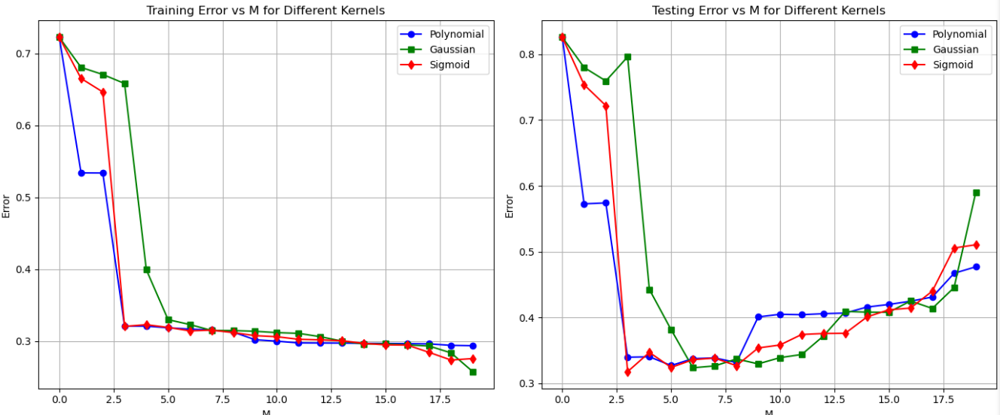

#### **a. Training Error (as M (model complexity) increases):**

1. All kernels start with high error at low **M**. As **M** increases, the training error consistently decreases for all kernels, with **sigmoid** and **gaussian** reaching the lowest error values.
2. The **polynomial kernel** shows a quick error reduction at **M = 3**, indicating a good fit. However, the **sigmoid kernel** drops sharply at **M = 3**, and the **gaussian kernel** at **M = 4**, suggesting possible **overfitti ng\*#### **b. Testing Error (as M (model complexity) increases):\*\*

3. All kernels begin with **high testing error** at **low M**. As **M** increases, the **testing error decreases** for all kernels, showing improved generalization.
4. The **polynomial kernel** demonstrates a **steady decrease** in error but shows a **slight increase** at **high M**, indicating **overfitting**.
5. The **gaussian kernel** exhibits a **sharp drop** in error at **M = 4**, but the **error spikes** around **M = 6**, suggesting **instability** and **sensitivity** to model complexity.
6. The **sigmoid kernel** maintains a **smooth and stable decline** in testing error, achieving **low and consistent performance**, indicating **good generalizatin**.ively.


## 3b) Repeating the previous exteriment on data having different local relationship


### Generating and plotting data


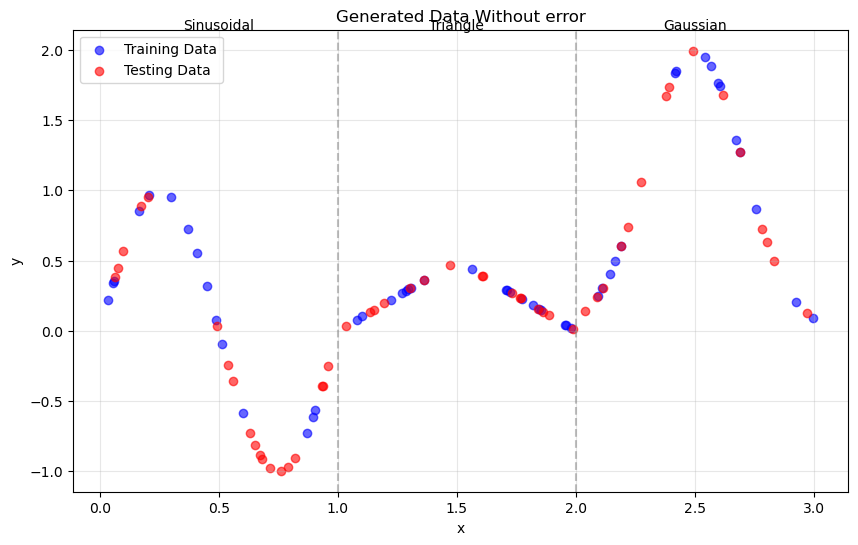

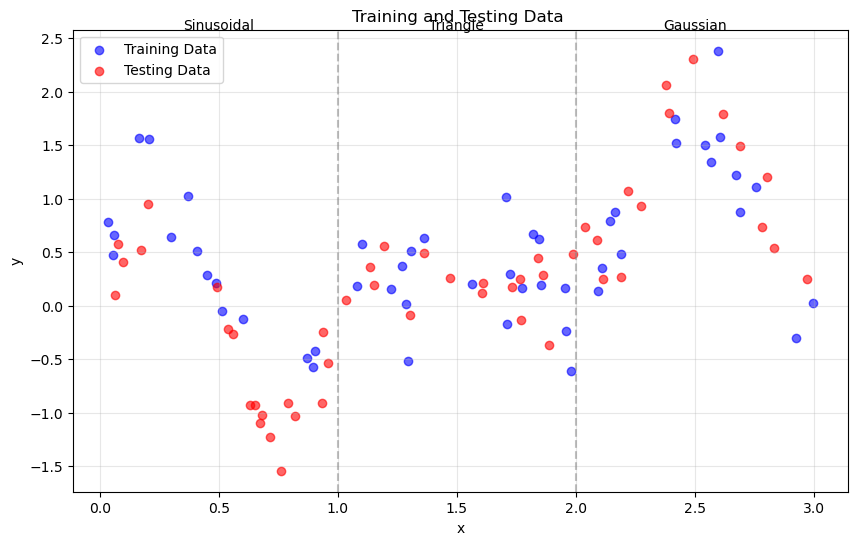

In [ ]:
########################################
# Generate 100 data points
########################################
np.random.seed(0)  # Set random seed for reproducibility
n = 100

mean = 0
var = 0.1
err_train = np.random.normal(mean, np.sqrt(var), n//2)
err_test = np.random.normal(mean, np.sqrt(var), n//2)

# Generate x values
x_train = np.sort(np.random.rand(n//2) * 3)  # Values between 0 and 3, sorted
x_test = np.sort(np.random.rand(n//2) * 3)   # Values between 0 and 3, sorted

def fnx(x):
    """Combined function for sinusoidal, triangle, and Gaussian regions"""
    ans = []
    for xi in x:
        if xi < 1:
            # Sinusoidal region [0,1)
            y = np.sin(2*np.pi*xi)
        elif xi < 2:
            # Triangle region [1,2)
            if xi <= 1.5:
                y = xi - 1  # Rising part
            else:
                y = -(xi - 2)  # Falling part
        else:
            # Gaussian region [2,3)
            y = (1/np.sqrt(2*np.pi*0.2**2)) * np.exp(-(xi-2.5)**2/(2*0.2**2))
        ans.append(y)
    return np.array(ans)


# Generate y values without noise
y_train = fnx(x_train) 
y_test = fnx(x_test) 

# Plot to verify the generated data
plt.figure(figsize=(10, 6))
plt.scatter(x_train, y_train, color='blue', label='Training Data', alpha=0.6)
plt.scatter(x_test, y_test, color='red', label='Testing Data', alpha=0.6)

# Add vertical lines to separate regions
plt.axvline(x=1, color='gray', linestyle='--', alpha=0.5)
plt.axvline(x=2, color='gray', linestyle='--', alpha=0.5)

# Add region labels
plt.text(0.5, plt.ylim()[1], 'Sinusoidal', horizontalalignment='center')
plt.text(1.5, plt.ylim()[1], 'Triangle', horizontalalignment='center')
plt.text(2.5, plt.ylim()[1], 'Gaussian', horizontalalignment='center')

plt.title('Generated Data Without error')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Generate y values with noise
y_train = fnx(x_train) + err_train
y_test = fnx(x_test) + err_test

# Plot to verify the generated data
plt.figure(figsize=(10, 6))
plt.scatter(x_train, y_train, color='blue', label='Training Data', alpha=0.6)
plt.scatter(x_test, y_test, color='red', label='Testing Data', alpha=0.6)

# Add vertical lines to separate regions
plt.axvline(x=1, color='gray', linestyle='--', alpha=0.5)
plt.axvline(x=2, color='gray', linestyle='--', alpha=0.5)

# Add region labels
plt.text(0.5, plt.ylim()[1], 'Sinusoidal', horizontalalignment='center')
plt.text(1.5, plt.ylim()[1], 'Triangle', horizontalalignment='center')
plt.text(2.5, plt.ylim()[1], 'Gaussian', horizontalalignment='center')

plt.title('Training and Testing Data ')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

### Regression & Plotting losses for Different M


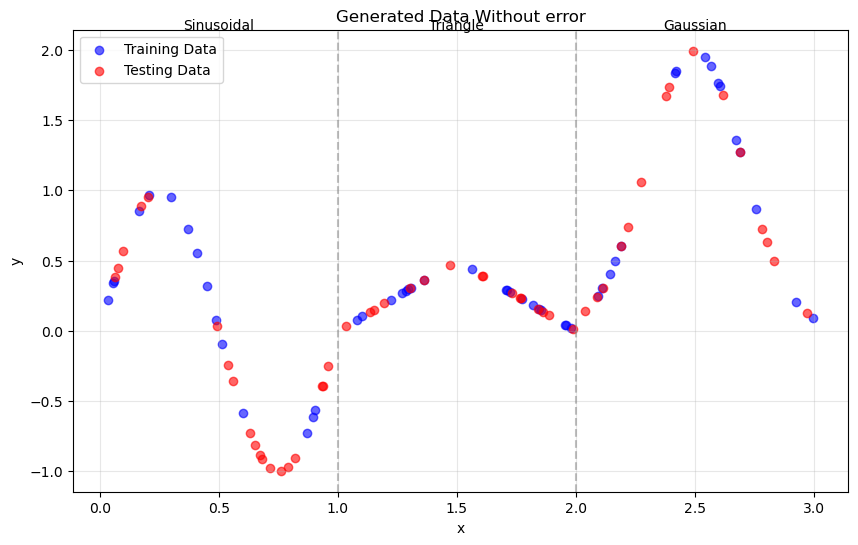

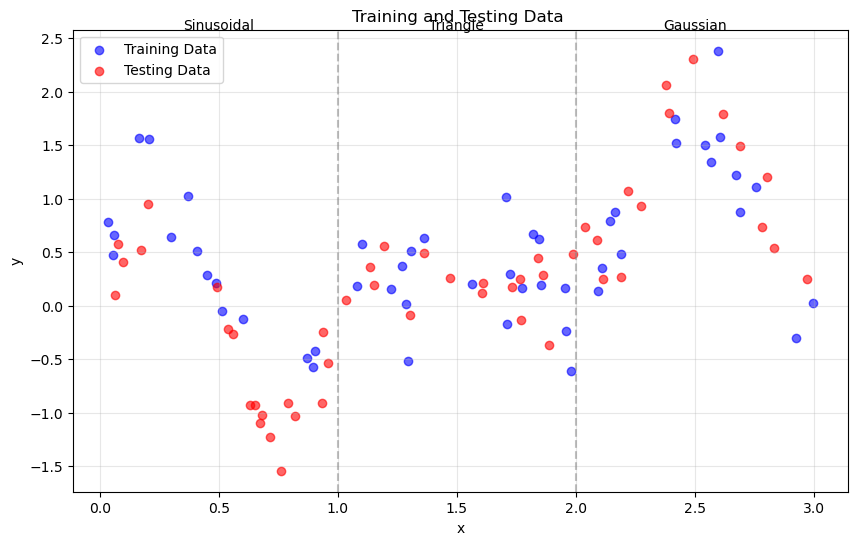

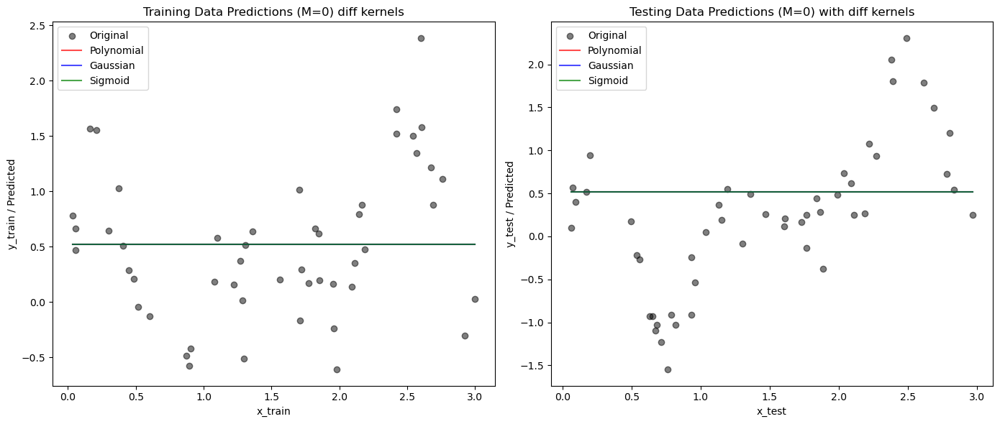

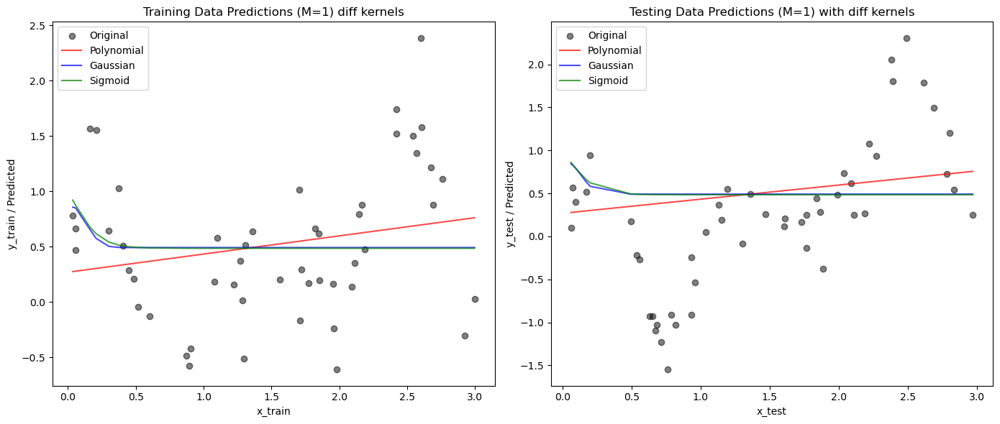

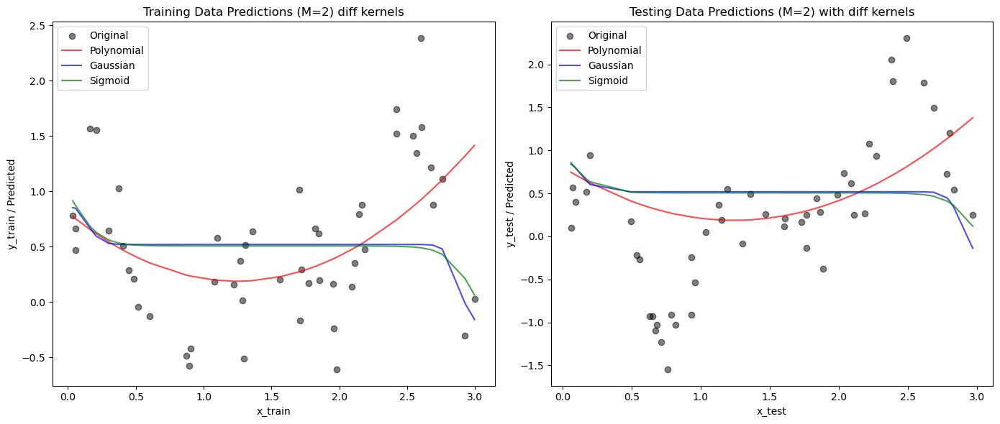

...

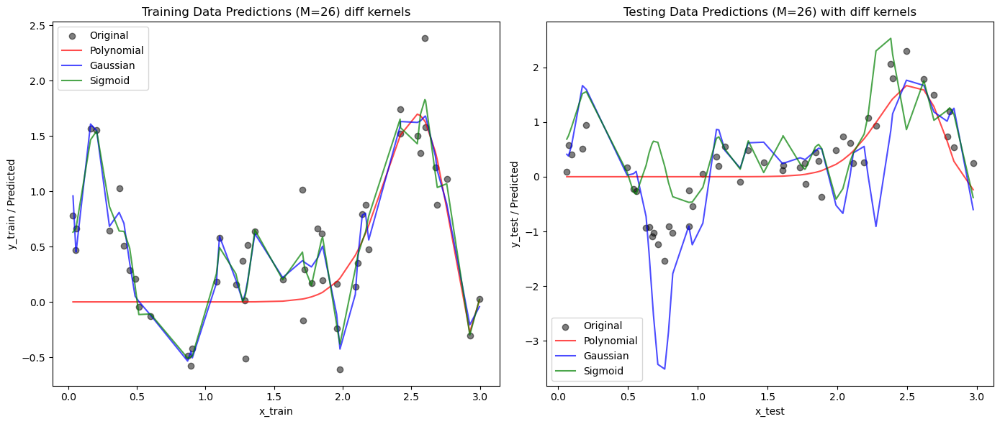

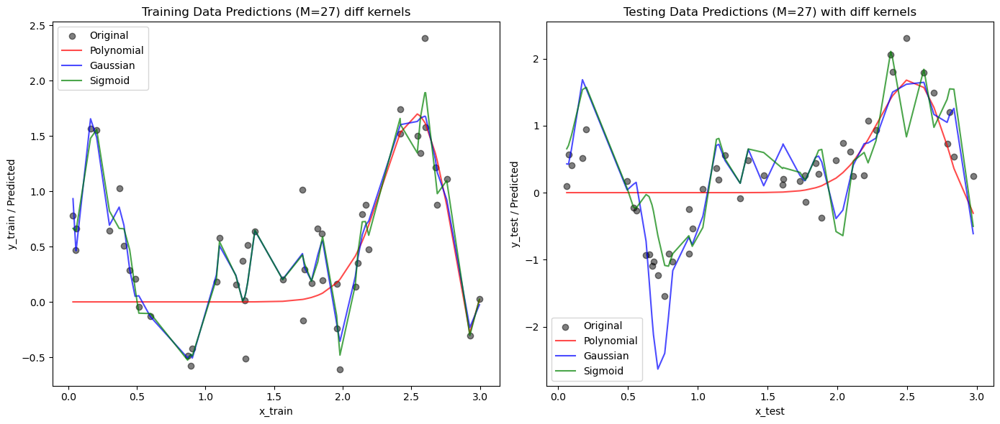

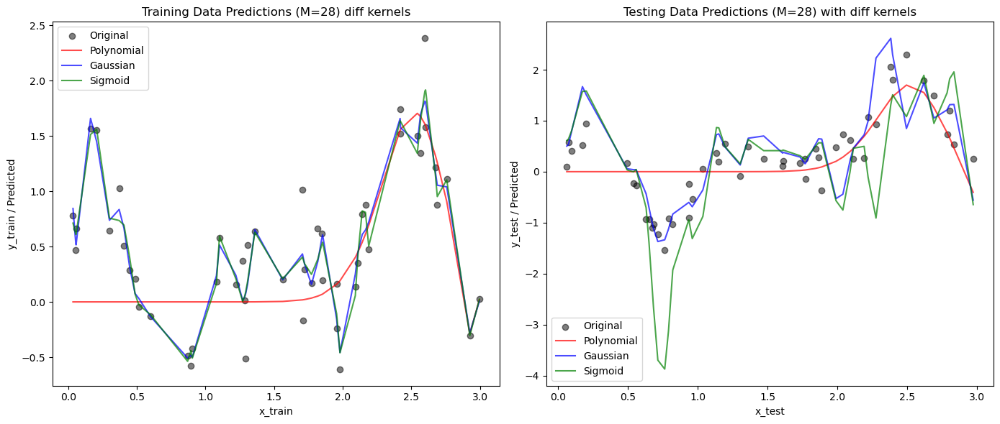

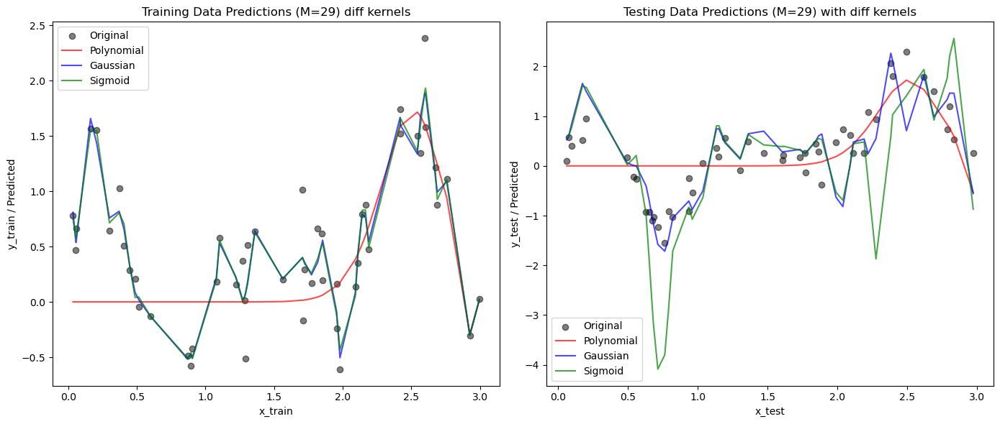

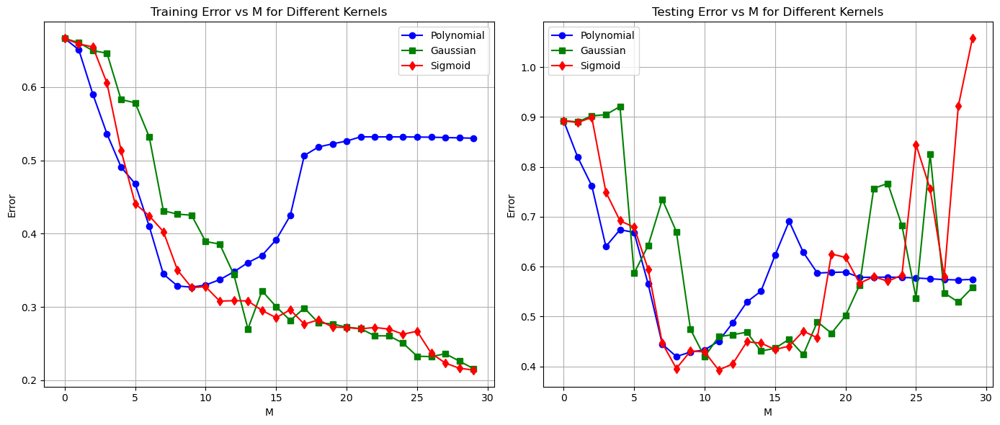

In [ ]:
# Iterate through range of M values
M_range = list(range(30))

polynomial_tr_error = []
polynomial_te_error = []
gaussian_tr_error = []
gaussian_te_error = []
sigmoid_tr_error = []
sigmoid_te_error = []
polynomial_tr_pred = []
polynomial_te_pred = []
gaussian_tr_pred = []
gaussian_te_pred = []
sigmoid_tr_pred = []
sigmoid_te_pred = []

for M in M_range:
    for kernelType in ['gaussian','sigmoidal','polynomial']: 
        
        #Predict w_opt , errors on both training and testing data with diff M
        w_est, tr_error, te_error, y_train_pred, y_test_pred = KernelRegressionPred_Error(x_train, y_train, x_test, y_test, M, kernelType)

        if(kernelType == 'polynomial'):
            polynomial_tr_error.append(tr_error)
            polynomial_te_error.append(te_error)
            polynomial_tr_pred.append(y_train_pred)
            polynomial_te_pred.append(y_test_pred)

        elif(kernelType == 'sigmoidal'):
            sigmoid_tr_error.append(tr_error)
            sigmoid_te_error.append(te_error)
            sigmoid_tr_pred.append(y_train_pred)
            sigmoid_te_pred.append(y_test_pred)
        else:
            gaussian_tr_error.append(tr_error)
            gaussian_te_error.append(te_error)
            gaussian_tr_pred.append(y_train_pred)
            gaussian_te_pred.append(y_test_pred)
                

for i, M in enumerate(M_range):
    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    plt.scatter(x_train, y_train, label='Original', color='black', alpha=0.5)
    plt.plot(x_train, polynomial_tr_pred[i].flatten(), label='Polynomial', color='red', alpha=0.7)
    plt.plot(x_train, gaussian_tr_pred[i].flatten(), label='Gaussian', color='blue', alpha=0.7)
    plt.plot(x_train, sigmoid_tr_pred[i].flatten(), label='Sigmoid', color='green', alpha=0.7)
    
    plt.xlabel('x_train')
    plt.ylabel('y_train / Predicted')
    plt.title(f'Training Data Predictions (M={M}) diff kernels')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.scatter(x_test, y_test, label='Original', color='black', alpha=0.5)
    plt.plot(x_test, polynomial_te_pred[i].flatten(), label='Polynomial', color='red', alpha=0.7)
    plt.plot(x_test, gaussian_te_pred[i].flatten(), label='Gaussian', color='blue', alpha=0.7)
    plt.plot(x_test, sigmoid_te_pred[i].flatten(), label='Sigmoid', color='green', alpha=0.7)
    
    plt.xlabel('x_test')
    plt.ylabel('y_test / Predicted')
    plt.title(f'Testing Data Predictions (M={M}) with diff kernels')
    plt.legend()
    plt.tight_layout()
    plt.show()
            
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(M_range, polynomial_tr_error, label='Polynomial', color='blue', marker='o')
plt.plot(M_range, gaussian_tr_error, label='Gaussian', color='green', marker='s')
plt.plot(M_range, sigmoid_tr_error, label='Sigmoid', color='red', marker='d')
plt.xlabel('M')
plt.ylabel('Error')
plt.title('Training Error vs M for Different Kernels')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(M_range, polynomial_te_error, label='Polynomial', color='blue', marker='o')
plt.plot(M_range, gaussian_te_error, label='Gaussian', color='green', marker='s')
plt.plot(M_range, sigmoid_te_error, label='Sigmoid', color='red', marker='d')
plt.xlabel('M')
plt.ylabel('Error')
plt.title('Testing Error vs M for Different Kernels')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

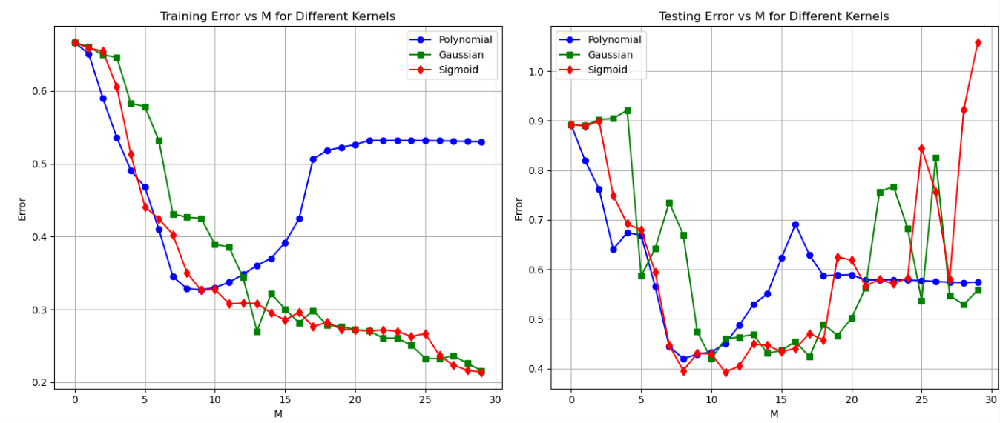

### **Training Error (Left Plot)**

- **Polynomial Kernel (Blue Line)**:

  - The error decreases initially but then starts to increase after \( M \approx 10 \).
  - This indicates potential overfitting as the model complexity increases.

- **Gaussian Kernel (Green Line)**:

  - Shows a sharp drop in error initially.
  - The error remains relatively low and stable, demonstrating good performance.
  - Slight oscillations at higher \( M \) values suggest possible sensitivity to hyperparameters.

- **Sigmoid Kernel (Red Line)**:

  - The error also decreases rapidly and remains low.
  - Consistent performance with no major spikes, indicating good generalization.

- **Overall Observation**:
  - Both Gaussian and Sigmoid kernels perform better than the Polynomial kernel on the training set.
  - The Polynomial kernel starts to overfit be\( M = 10 \).

---

### **Testing Error (Right Plot)**

- **Polynomial Kernel (Blue Line)**:

  - Shows an initial decrease in error, achieving a stable and low error for higher \( M \) values.
  - It generalizes well on the test set for \( M > 10 \).

- **Gaussian Kernel (Green Line)**:

  - Initial error is high with erratic behavior at low \( M \).
  - Stabilizes and achieves low error for intermediate \( M \), but increases again at higher \( M \).
  - The spike at high \( M \) suggests potential overfitting or instability.

- **Sigmoid Kernel (Red Line)**:

  - Initially performs well but has high error and instability at higher \( M \) values.
  - The spikes in error indicate overfitting or sensitivity to the data.

- **Overall Observation**:
  - The Polynomial kernel achieves the most stable performance at higher \( M \) values.
  - The Gaussian kernel performs well in the middle range but is less stable overall.
  - The Sigmoid kernel is the least stable, sh


<h1><b>Part 4: Understanding online training</b></h1>


### Data Generation of 3a


In [ ]:
########################################
#Generate 100 data points
########################################
import numpy as np

np.random.seed(0)  
n = 100

x_train = np.random.rand(n // 2) * 1  # 50 values between 0 and 1 for training
x_test = np.random.rand(n // 2) * 1   # 50 values between 0 and 1 for testing

mean = 0
var = 0.1
err = np.random.normal(mean, np.sqrt(var), n)


def sinusoidal(x):
    return np.sin(2 * np.pi * x)

y_train = sinusoidal(x_train) + err[:n // 2]
y_test = sinusoidal(x_test) + err[n // 2:]

train_sort_idx = np.argsort(x_train)
x_train = x_train[train_sort_idx]
y_train = y_train[train_sort_idx]

test_sort_idx = np.argsort(x_test)
x_test = x_test[test_sort_idx]
y_test = y_test[test_sort_idx]

print(x_train.shape,x_test.shape,y_train.shape,y_test.shape)

(50,) (50,) (50,) (50,)


### Gradient descent


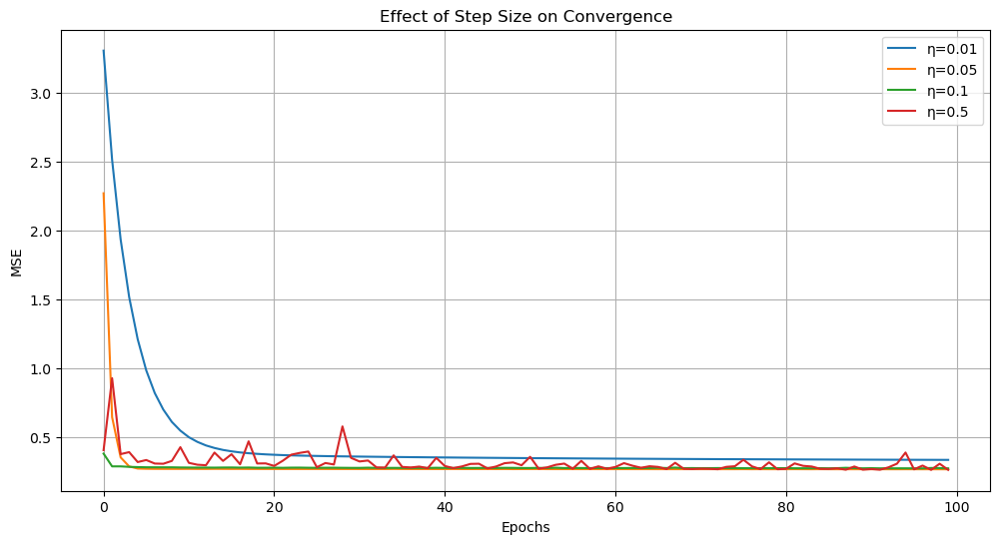

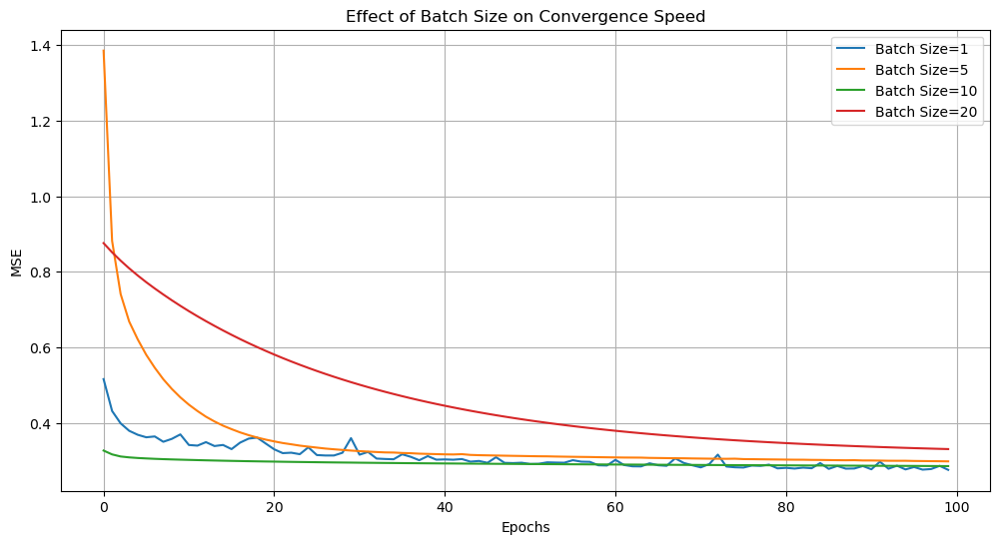

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


def sigmoid(x):
    return 1 / (1 + np.exp(-x))


def KernelRegression_SGD(X_train, Y_train, X_test, Y_test, M, kernelType, eta=0.01, batch_size=10, epochs=100):
    
    Y_train = np.reshape(Y_train, (-1, 1))
    Y_test = np.reshape(Y_test, (-1, 1))

    X_train_transformed, X_test_transformed = KernelTransform(X_train, X_test, M, kernelType)
    
    w_est = np.random.randn(X_train_transformed.shape[1], 1) # random weight
    
    N = len(X_train_transformed)
    
    mse_losses = []  
    
    for epoch in range(epochs):
        indices = np.random.permutation(N)  # Shuffle data
        X_shuffled = X_train_transformed[indices]
        Y_shuffled = Y_train[indices]
        
        for i in range(0, N, batch_size):
            X_batch = X_shuffled[i:i + batch_size]
            Y_batch = Y_shuffled[i:i + batch_size]

            # print(X_batch.shape,w_est.shape)
            # Compute prediction
            y_pred = X_batch @ w_est
            
            gradient = (X_batch.T @ (y_pred - Y_batch)) / batch_size
            
            w_est -= eta * gradient
        
        y_train_pred = X_train_transformed @ w_est
        mse = np.mean((Y_train - y_train_pred) ** 2)
        mse_losses.append(mse)
    
    y_test_pred = X_test_transformed @ w_est
    test_mse = np.mean((Y_test - y_test_pred) ** 2)
    
    return w_est, mse_losses, test_mse, y_train_pred, y_test_pred

# experiment with different etas
etas = [ 0.01,0.05, 0.1, 0.5]
M = 3  
batch_size = 5  

plt.figure(figsize=(12, 6))
for eta in etas:
    _, mse_history, _, _, _ = KernelRegression_SGD(x_train, y_train, x_test, y_test, M, "polynomial", eta=eta, batch_size=batch_size)
    plt.plot(mse_history, label=f'η={eta}')

plt.xlabel("Epochs")
plt.ylabel("MSE")
plt.title("Effect of Step Size on Convergence")
plt.legend()
plt.grid(True)
plt.show()

batch_sizes = [1, 5, 10,20]
eta = 0.05  

plt.figure(figsize=(12, 6))
for batch_size in batch_sizes:
    _, mse_history, _, _, _ = KernelRegression_SGD(
        x_train, y_train, x_test, y_test, M, "polynomial", eta=eta, batch_size=batch_size)
    plt.plot(mse_history, label=f'Batch Size={batch_size}')

plt.xlabel("Epochs")
plt.ylabel("MSE")
plt.title("Effect of Batch Size on Convergence Speed")
plt.legend()
plt.grid(True)
plt.show()


### Data & Plot for 3b


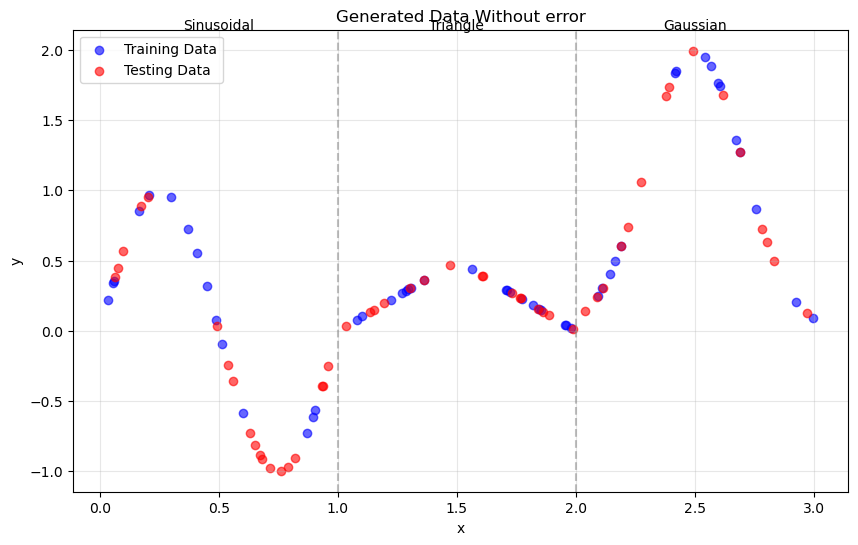

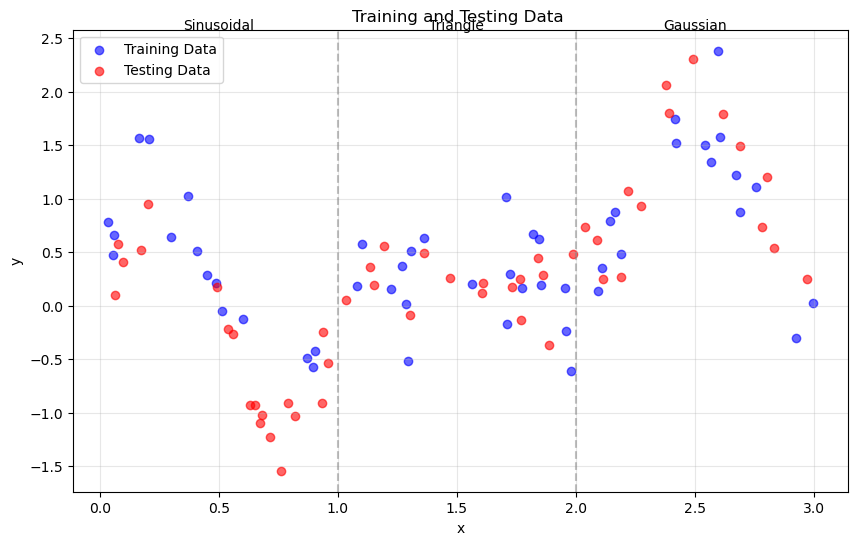

In [ ]:
########################################
# Generate 100 data points
########################################
np.random.seed(0)  
n = 100


mean = 0
var = 0.1
err_train = np.random.normal(mean, np.sqrt(var), n//2)
err_test = np.random.normal(mean, np.sqrt(var), n//2)

x_train = np.sort(np.random.rand(n//2) * 3)  # Values between 0 and 3, sorted
x_test = np.sort(np.random.rand(n//2) * 3)   # Values between 0 and 3, sorted

def fnx(x):
    """Combined function for sinusoidal, triangle, and Gaussian regions"""
    ans = []
    for xi in x:
        if xi < 1:
            # Sinusoidal region [0,1)
            y = np.sin(2*np.pi*xi)
        elif xi < 2:
            # Triangle region [1,2)
            if xi <= 1.5:
                y = xi - 1  
            else:
                y = -(xi - 2)  
        else:
            # Gaussian region [2,3)
            y = (1/np.sqrt(2*np.pi*0.2**2)) * np.exp(-(xi-2.5)**2/(2*0.2**2))
        ans.append(y)
    return np.array(ans)



y_train = fnx(x_train) 
y_test = fnx(x_test) 

plt.figure(figsize=(10, 6))
plt.scatter(x_train, y_train, color='blue', label='Training Data', alpha=0.6)
plt.scatter(x_test, y_test, color='red', label='Testing Data', alpha=0.6)

plt.axvline(x=1, color='gray', linestyle='--', alpha=0.5)
plt.axvline(x=2, color='gray', linestyle='--', alpha=0.5)

plt.text(0.5, plt.ylim()[1], 'Sinusoidal', horizontalalignment='center')
plt.text(1.5, plt.ylim()[1], 'Triangle', horizontalalignment='center')
plt.text(2.5, plt.ylim()[1], 'Gaussian', horizontalalignment='center')

plt.title('Generated Data Without error')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

y_train = fnx(x_train) + err_train
y_test = fnx(x_test) + err_test

plt.figure(figsize=(10, 6))
plt.scatter(x_train, y_train, color='blue', label='Training Data', alpha=0.6)
plt.scatter(x_test, y_test, color='red', label='Testing Data', alpha=0.6)

plt.axvline(x=1, color='gray', linestyle='--', alpha=0.5)
plt.axvline(x=2, color='gray', linestyle='--', alpha=0.5)

plt.text(0.5, plt.ylim()[1], 'Sinusoidal', horizontalalignment='center')
plt.text(1.5, plt.ylim()[1], 'Triangle', horizontalalignment='center')
plt.text(2.5, plt.ylim()[1], 'Gaussian', horizontalalignment='center')

plt.title('Training and Testing Data ')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

### Gradient descent


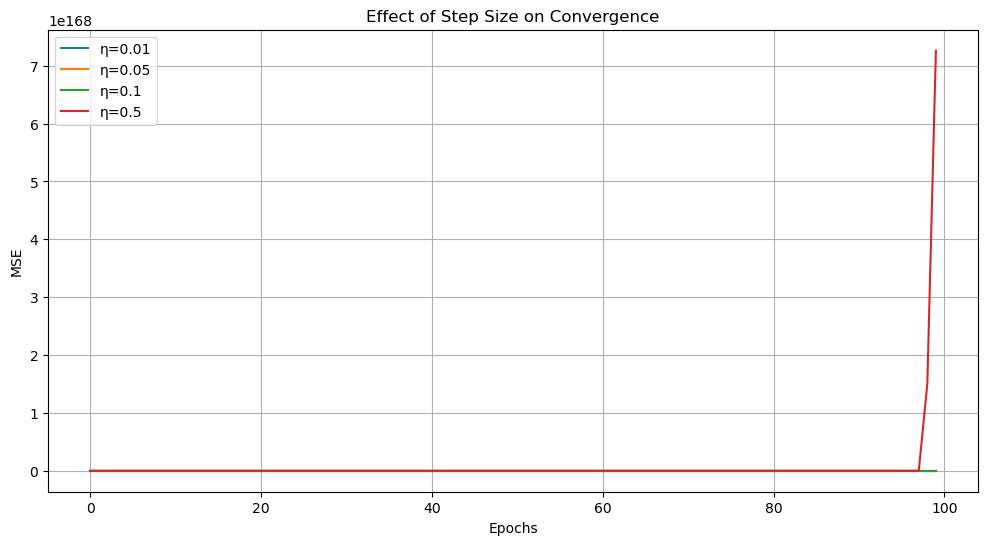

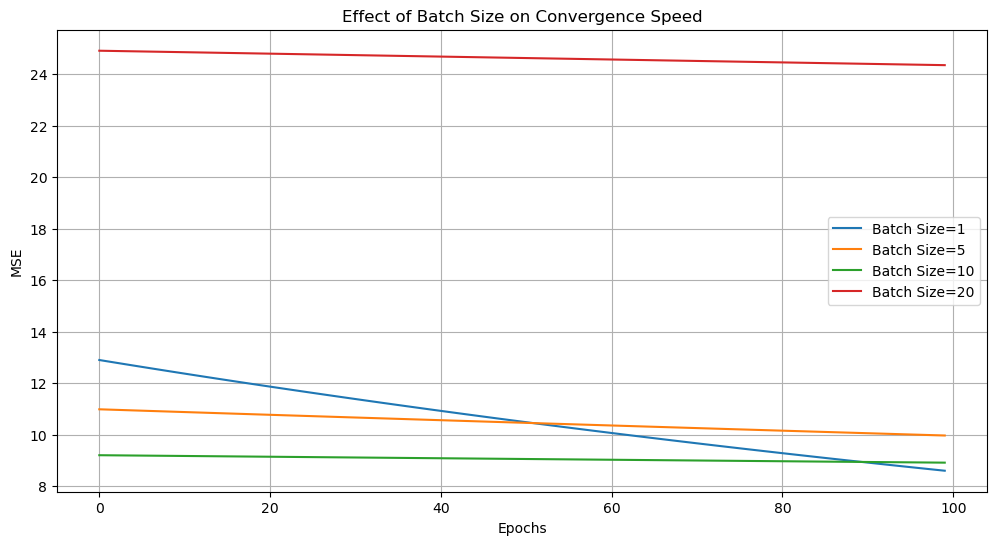

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def KernelRegression_SGD(X_train, Y_train, X_test, Y_test, M, kernelType, eta=0.01, batch_size=10, epochs=100):
    
    Y_train = np.reshape(Y_train, (-1, 1))
    Y_test = np.reshape(Y_test, (-1, 1))

    mean = np.mean(X_train, axis=0)
    std = np.std(X_train, axis=0)
    
    X_train = (X_train - mean) / std
    X_test = (X_test - mean) / std

    X_train_transformed, X_test_transformed = KernelTransform(X_train, X_test, M, kernelType)
    
    w_est = np.random.randn(X_train_transformed.shape[1], 1) 
    
    N = len(X_train_transformed)
    
    mse_losses = [] 
    
    for epoch in range(epochs):
        indices = np.random.permutation(N)  
        X_shuffled = X_train_transformed[indices]
        Y_shuffled = Y_train[indices]
        
        for i in range(0, N, batch_size):
            X_batch = X_shuffled[i:i + batch_size]
            Y_batch = Y_shuffled[i:i + batch_size]

            # print(X_batch.shape,w_est.shape)
            # Compute prediction
            y_pred = X_batch @ w_est
            
            gradient = (X_batch.T @ (y_pred - Y_batch)) / batch_size
            w_est -= eta * gradient
        
        y_train_pred = X_train_transformed @ w_est
        mse = np.mean((Y_train - y_train_pred) ** 2)
        mse_losses.append(mse)
    
   
    y_test_pred = X_test_transformed @ w_est
    test_mse = np.mean((Y_test - y_test_pred) ** 2)
    
    return w_est, mse_losses, test_mse, y_train_pred, y_test_pred

etas = [ 0.01,0.05, 0.1, 0.5]
M = 3  
batch_size = 5  

plt.figure(figsize=(12, 6))
for eta in etas:
    _, mse_history, _, _, _ = KernelRegression_SGD(x_train, y_train, x_test, y_test, M, "polynomial", eta=eta, batch_size=batch_size)
    plt.plot(mse_history, label=f'η={eta}')

plt.xlabel("Epochs")
plt.ylabel("MSE")
plt.title("Effect of Step Size on Convergence")
plt.legend()
plt.grid(True)
plt.show()

batch_sizes = [1, 5, 10,20]
eta = 1e-5  

plt.figure(figsize=(12, 6))
for batch_size in batch_sizes:
    _, mse_history, _, _, _ = KernelRegression_SGD(
        x_train, y_train, x_test, y_test, M, "polynomial", eta=eta, batch_size=batch_size)
    plt.plot(mse_history, label=f'Batch Size={batch_size}')

plt.xlabel("Epochs")
plt.ylabel("MSE")
plt.title("Effect of Batch Size on Convergence Speed")
plt.legend()
plt.grid(True)
plt.show()


<b> Report your observations </b>

1.

2.

3.


<h1><b>Part 5: Understanding bias-variance trade-off</b></h1>


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(0)

datas = [] 
L = 100
N = 25  
M = 25 

def sinusoidal(x):
    return np.sin(2 * np.pi * x)

def y(x):
    """Returning output with noise"""
    err = np.random.normal(0, 0.05, size=len(x)) 
    return sinusoidal(x) + err

for i in range(L):
    x = np.random.rand(N)*1 
    x.sort()
    y_noise = y(x)
    datas.append([x, list(y_noise)])

datas = np.array(datas)
x = datas[0]
y = datas[1]
# datas[i] is 2x25 with datas[i][0] --> x and datas[i][1] --> y

def GaussianKernel(x, M=25,s=0,e =1):
    """ x(input) -> [1,x1,x2,...,x24](output:List)(higher dim vector with gaussion basis fnx)"""
    mu_s = np.linspace(s, 1, M - 1)
    x_t = [1]
    for mu in mu_s:
        x_t.append(np.exp(-((x - mu) ** 2) / (2 * 0.1 ** 2)))
    return x_t

# Regularized least squares to estimate w
datas_pred = []  # final shape:(L(datasets) ,3(for λ1,λ2,λ3) ,N(data points in each datasets))
lamdas = [1e-5, 1e-3, 1e-1]  # low,middle,high
w_sum = np.zeros((3,M))

for data in datas:
    data_preds = []  # predictions for current dataset
    y = np.array(data[1]).reshape((N, 1))  # Changed M to N here
    for i, lamda in enumerate(lamdas):
        X = []
        for x_i in data[0]:  # Use current dataset's x values
            x_i = GaussianKernel(x_i)
            X.append(x_i)
        X = np.array(X)
        w = np.linalg.pinv(X.T @ X + lamda * np.eye(M)) @ X.T @ y
        w_sum[i] += w.flatten()
        y_pred = X @ w
        data_preds.append(y_pred.flatten())  # append predictions for this lambda
    datas_pred.append(data_preds)  # append all predictions for this dataset
datas_pred = np.array(datas_pred)  # Convert to numpy array
#datas_pred = shape:(L(datasets) ,3(for λ1,λ2,λ3) ,N(data points in each datasets))

w_avg = w_sum / L  # Compute average weights
W = np.array(w_avg).reshape((M,len(lamdas))) # shape:(M,3)

# For Average Estimation of fnx
x_est = np.linspace(0, 1, 25)
y_avg = []  # store average estimation, shape:(3,N)
for i in range(len(lamdas)):
    y = []
    w_i = W[:,i].flatten()
    for x in x_est:
        x_i = np.array(GaussianKernel(x)).flatten()  # shape: (M,)
        y_esti = np.dot(x_i, w_i)  # Changed to dot product
        y.append(y_esti)
    y_avg.append(y) 

y_true = sinusoidal(x_est)
colors = plt.cm.viridis(np.linspace(0, 1, L))
for i, lamda in enumerate(lamdas):
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    axes[0].set_title(f"Estimation for λ = {lamda}")
    for j in range(L):
        x = datas[j][0]
        pred = datas_pred[j][i]
        axes[0].plot(x, pred, marker='.', c=colors[j], alpha=0.3)
    axes[0].set_xlabel("x")
    axes[0].set_ylabel("y")

    # Plot the mean of the estimated curves and the true function
    axes[1].plot(x_est, y_avg[i], 'r-', label='Average Estimation')
    axes[1].plot(x_est, y_true, 'b-', label='True function')
    axes[1].set_title(f"Average Estimation for λ = {lamda}")
    axes[1].legend()
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()

plt.figure(figsize=(10, 6))
# Variance curve
for i, lamda in enumerate(lamdas):
    # Calculate variance as the average squared difference between individual predictions and mean prediction
    variance = np.mean((datas_pred[:, i, :] - y_avg[i]) ** 2, axis=0)
    print(f"λ = {lamda}, sum = {variance.sum()}")
    plt.plot(x_est, variance, label=f"λ = {lamda}")

plt.title("Variance Comparison for Different λ Values")
plt.xlabel("x")
plt.ylabel("Absolute Error")
plt.legend()
plt.grid(True)
plt.show()


<b> Report your observations </b>

1.

2.

3. As we increase the regularisation coefficient, bias increases whereas variance decreases.


<h1><b>Part 6:  Understanding Maximum a Posteriori (MAP) estimate</b>


(a). Generate 100 noisy data points of a sinusoid. Fit a $20^{th}$ order linear regression model with Gaussian basis functions. Starting from a standard normal prior, update the statistics of the posterior density of the parameters using Bayesian sequential updates.

(b). Sample a parameter vector from the posterior distribution, and obtain the curve fit for this realization. Repeat this for several times, and estimate the average of these curve fits, and compare it with the original sinusoid

(c). Use the posterior distribution of the parameters to evaluate the predictive distribution of target $p(t_{0}/x_{0},X,t)$, and plot it for different number of training data points, as discussed in the class.

(d). Report all your observations


In [ ]:
def gaussian_basis_function(x, mean, std_dev):
    return np.exp(-np.square(x - mean) / (2 * (std_dev**2)))

def gaussian_kernel(x, left, right):
    return np.array([gaussian_basis_function(x, j, 0.5) for j in np.linspace(left, right, 20)])

def gaussian_kernel_matrix(x, left, right):
    kernel_matrix = []
    for val in x:
        kernel_matrix.append(np.array([gaussian_basis_function(val, j, 0.5) for j in np.linspace(left, right, 20)]))
    return np.array(kernel_matrix)

# Understanding MAP estimate
########################################
# Generate 100 data sets of noisy sinusoidal data
########################################

def sinusoidal_function(x):
    return np.sin(2 * np.pi * x)

def generate_noisy_data(func, start, end, num_points):
    x_values = np.linspace(start, end, num_points)
    y_values = func(x_values) + np.random.normal(0, 0.2, size=x_values.shape)
    return x_values, y_values

x_values, y_values = generate_noisy_data(sinusoidal_function, 0, 1, 100)

beta_param = 25
alpha_param = 0.001

########################################
# Update the statistics of posterior density
########################################
# Initialize the parameters for standard normal prior

prior_mean = np.zeros(20)
prior_variance = np.eye(20) * (1 / alpha_param)
posterior_mean = prior_mean
posterior_variance = prior_variance

# Iterate through the data points and update the stats of posterior density
prior_mean = np.reshape(np.zeros(20), (20, 1))
prior_variance = np.eye(20) * (1 / alpha_param)
posterior_mean = prior_mean
posterior_variance = prior_variance
for i in range(len(x_values)):
    phi_vector = gaussian_kernel(x_values[i], min(x_values), max(x_values))
    phi_vector = np.reshape(phi_vector, (20, 1))
    posterior_variance = np.linalg.inv(np.linalg.inv(prior_variance) + beta_param * (phi_vector @ phi_vector.T))
    posterior_mean = posterior_variance @ (np.linalg.inv(prior_variance) @ prior_mean + beta_param * y_values[i] * phi_vector)
    prior_mean = posterior_mean
    prior_variance = posterior_variance
weights_vector = np.reshape(np.random.multivariate_normal(posterior_mean.ravel(), posterior_variance), (20, 1))

########################################
# Sample weight vector from posterior distribution. Estimate the curve, repeat the procedure for 100 times and get the avg fit
########################################

average_weights = np.zeros((20, 1))

plot_ax = plt.subplot()
for j in range(100):
    weights_vector = np.reshape(np.random.multivariate_normal(posterior_mean.ravel(), posterior_variance), (20, 1))
    if j < 100:
        plot_ax.plot(x_values, gaussian_kernel_matrix(x_values, min(x_values), max(x_values)) @ weights_vector, color="orange", lw=0.1)
    average_weights += weights_vector
plot_ax.plot(x_values, np.sin(2 * np.pi * x_values), color='g', alpha=0.5, label='sin(2\u03C0x)')
plot_ax.set_title("Estimated Curves")
plot_ax.legend()
plt.show()
average_weights = average_weights / 100

avg_fit_plot = plt.subplot()
avg_fit_plot.plot(x_values, gaussian_kernel_matrix(x_values, min(x_values), max(x_values)) @ average_weights, marker='.', color="orange", label="Average curve")
avg_fit_plot.scatter(x_values, y_values, marker='.', color="blue", label="Actual dataset with noise")
avg_fit_plot.set_title('Average Fit')
avg_fit_plot.legend()
plt.show()

def shuffle_data(a, b):
    assert len(a) == len(b)
    permutation = np.random.permutation(len(a))
    return a[permutation], b[permutation]

x_data, y_data = x_values, y_values
x_values, y_values = shuffle_data(x_values, y_values)

partial_points = [1, 2, 4, 16, 32, 100]
prior_mean = np.reshape(np.zeros(20), (20, 1))
prior_variance = np.eye(20) * (1 / alpha_param)
posterior_mean = prior_mean
posterior_variance = prior_variance
for i in range(100):
    phi_vector = gaussian_kernel(x_values[i], min(x_values), max(x_values))
    phi_vector = np.reshape(phi_vector, (20, 1))
    posterior_variance = np.linalg.inv(np.linalg.inv(prior_variance) + beta_param * (phi_vector @ phi_vector.T))
    posterior_mean = posterior_variance @ (np.linalg.inv(prior_variance) @ prior_mean + beta_param * y_values[i] * phi_vector)
    prior_mean = posterior_mean
    prior_variance = posterior_variance
    if i + 1 in partial_points:
        for _ in range(10):
            kernel_matrix = gaussian_kernel_matrix(x_data, min(x_values), max(x_values))
            weights_vector = np.reshape(np.random.multivariate_normal(posterior_mean.ravel(), posterior_variance), (20, 1))
            estimated_curve = kernel_matrix @ weights_vector
            plt.plot(x_data, estimated_curve, lw=0.7, color='r', alpha=0.8)
        plt.plot(x_data, np.sin(2 * np.pi * x_data), color='green', label='sin(2\u03C0x)')
        plt.scatter(x_values[:i + 1], y_values[:i + 1], color='black', facecolor='None', alpha=0.6)
        plt.title(f'Sampled curves with {i + 1} partial points seen')
        plt.legend()
        plt.show()

for num_points in [1, 2, 3, 4, 16, 32, 100]:
    prior_mean = np.reshape(np.zeros(20), (20, 1))
    prior_variance = np.eye(20) * (1 / alpha_param)
    posterior_mean = prior_mean
    posterior_variance = prior_variance
    fig, ax = plt.subplots()
    for i in np.linspace(0, 99, num_points).astype(int):
        phi_vector = gaussian_kernel(x_values[i], min(x_values), max(x_values))
        phi_vector = np.reshape(phi_vector, (20, 1))
        posterior_variance = np.linalg.inv(np.linalg.inv(prior_variance) + beta_param * (phi_vector @ phi_vector.T))
        posterior_mean = posterior_variance @ (np.linalg.inv(prior_variance) @ prior_mean + beta_param * y_values[i] * phi_vector)
        prior_mean = posterior_mean
        prior_variance = posterior_variance
        ax.scatter(x_values[i], y_values[i], marker='o', edgecolors='blue', facecolors='none', alpha=0.6)
    x_values_dense = np.linspace(0, 1, 1000)
    predictive_variance = []
    for val in x_values_dense:
        kernel_vector = np.reshape(gaussian_kernel(val, min(x_values), max(x_values)), (20, 1))
        variance = 1 / beta_param + np.dot(kernel_vector.T @ posterior_variance, kernel_vector)
        predictive_variance.append(variance)
    predictive_variance = np.array(predictive_variance).ravel()
    predictive_mean = gaussian_kernel_matrix(x_values_dense, min(x_values), max(x_values)) @ posterior_mean
    predictive_mean = predictive_mean.ravel()
    ax.fill_between(x_values_dense, predictive_mean + 2 * np.sqrt(predictive_variance), predictive_mean - 2 * np.sqrt(predictive_variance), alpha=0.3, color='red')
    ax.plot(x_values_dense, predictive_mean, color="green", label='Estimated curve')
    ax.plot(x_values_dense, np.sin(2 * np.pi * x_values_dense), color="r", label='sin(2\u03C0x)')
    ax.set_title((f'Predictive distribution with {num_points} partial points seen'))
    ax.legend()
    plt.show()


<b> Report your observations </b>

1. On sampling 100 times from the posterior means,covariance we get the average curve to be almost coincinding the original curve as plotted.

2. As the number of points used to train the model increases, The predicted curves from sampling show lower variance and the accuracy of the predictions improve.

3. The predictive distributions seem to have a lot of variance in their predictions initially with lesser training points as can be seen from the shaded region.

4. Moreover the variance in predictions is less at the points that are used to train the model. As we increase the training points the curve gets thinner and the predictions of the model approach more precise values

5. Overall, As the training points increase, The model predicts a curve with much better accuracy.
